
# <div style="text-align:center"> United Kingdom's Climate Change Analysis And Surface Temperature Forecasting</div>


<div style="text-align:center">
    <img src="https://t4.ftcdn.net/jpg/02/66/38/15/360_F_266381525_alVrbw15u5EjhIpoqqa1eI5ghSf7hpz7.jpg" alt="alt text" width="500px">

</div>


# Table of Contents

1. [Introduction](#Introduction)
   - Project Overview
   - Objective
   - Dataset Description


2. [Data Preparation and Exploration](#Data-Preparation-And-Exploration)
   - Loading the Dataset
   - Exploratory Data Analysis
   - Handling Missing Values


3. [Time Series Analysis](#Time-Series-Analysis)
   - Understanding Time Series Data
   - Decomposition and Seasonality Analysis
   - Stationarity Check
   - Autocorrelation and Partial Autocorrelation Analysis


4. [Forecasting Models](#Forecasting-Models)
   - Baseline Model: Moving Average
   - Basic Models : Machine Learning Regression Models :
       - Random Forest Regressor (RFR)
       - Linear Regression (LR)
       - Support Vector Regression (SVR)
   - Advanced Models:
       - Autoregressive Integrated Moving Average (ARIMA)
       - Seasonal Autoregressive Integrated Moving Average (SARIMA)
       - Convolutional Neural Networks (CNNs)
       - Long Short-Term Memory (LSTM) Network

5. [Conclusion](#Conclusion)
   - Summary of the Project
   - Future Work and Improvements
   - Key Takeaways


6. [References](#references)


# Introduction

## - Project Overview

* The project aims to analyze the trends and patterns in the surface temperature data of the United Kingdom and develop forecasting models to predict future temperature variations. The selected dataset, "Climate Change: Earth Surface Temperature Data," obtained from Kaggle, provides historical temperature records on a global scale. The dataset's wide coverage and availability of long-term temperature data make it suitable for studying climate change and its impact on temperature patterns.

## - Objective
* The main objective of this project is to conduct a comprehensive analysis of the United Kingdom's surface temperature data, identify significant trends and patterns, and develop robust forecasting models to accurately predict future temperature variations. By leveraging time series analysis techniques and machine learning algorithms, the project aims to provide valuable insights into the climate dynamics of the United Kingdom and contribute to a better understanding of the impacts of climate change.

## - Dataset Description

* The Berkeley Earth Surface Temperature Study combines 1.6 billion temperature reports from 16 pre-existing archives. It is nicely packaged and allows for slicing into interesting subsets (for example by country or By state). They publish the source data and the code for the transformations they applied. They also use methods that allow weather observations from shorter time series to be included, meaning fewer observations need to be thrown away.

In this dataset, several files have been included:

Global Land and Ocean-and-Land Temperatures **(GlobalTemperatures.csv)**:

* **Date:** starts in 1750 for average land temperature and 1850 for max and min land temperatures and global ocean and land temperatures
* **LandAverageTemperature:** global average land temperature in celsius
* **LandAverageTemperatureUncertainty:** the 95% confidence interval around the average
* **LandMaxTemperature:** global average maximum land temperature in celsius
* **LandMaxTemperatureUncertainty:** the 95% confidence interval around the maximum land temperature
* **LandMinTemperature:** global average minimum land temperature in celsius
* **LandMinTemperatureUncertainty:** the 95% confidence interval around the minimum land temperature
* **LandAndOceanAverageTemperature:** global average land and ocean temperature in celsius
* **LandAndOceanAverageTemperatureUncertainty:** the 95% confidence interval around the global average land and ocean temperature

Other files include:

1. Global Average Land Temperature by Country (**GlobalLandTemperaturesByCountry.csv**)
1. Global Average Land Temperature by State (**GlobalLandTemperaturesByState.csv**)
1. Global Land Temperatures By Major City (**GlobalLandTemperaturesByMajorCity.csv**)
1. Global Land Temperatures By City (**GlobalLandTemperaturesByCity.csv**)

Dataset source: [Climate Change: Earth Surface Temperature Data](https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data)

# Data Preparation And Exploration

## - Loading the Dataset

* Importing need libraries for this part

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import os 

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error
from math import sqrt

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR

from statsmodels.tsa.arima.model import ARIMA
from sklearn.model_selection import TimeSeriesSplit, ParameterGrid
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from keras.preprocessing.sequence import TimeseriesGenerator
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, Flatten
import visualkeras
from PIL import ImageFont #Version required (! pip install Pillow==9.5.0)


* Check for available files in the dataset folder

In [3]:
os.listdir("dataset")

['GlobalLandTemperaturesByCity.csv',
 'GlobalLandTemperaturesByCountry.csv',
 'GlobalLandTemperaturesByMajorCity.csv',
 'GlobalLandTemperaturesByState.csv',
 'GlobalTemperatures.csv']

* Loading the Global Land Temperature dataset by country

In [4]:
global_temp_bycountry = pd.read_csv('dataset/GlobalLandTemperaturesByCountry.csv')
global_temp_bycountry

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1743-12-01,NaN,NaN,Åland
2,1744-01-01,NaN,NaN,Åland
3,1744-02-01,NaN,NaN,Åland
4,1744-03-01,NaN,NaN,Åland
...,...,...,...,...
577457,2013-05-01,19.059,1.022,Zimbabwe
577458,2013-06-01,17.613,0.473,Zimbabwe
577459,2013-07-01,17.000,0.453,Zimbabwe
577460,2013-08-01,19.759,0.717,Zimbabwe


* Loading the Global Land Temperature dataset by state

In [5]:
global_temp_byCity = pd.read_csv('dataset/GlobalLandTemperaturesByCity.csv')
global_temp_byCity

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
0,1743-11-01,6.068,1.737,Århus,Denmark,57.05N,10.33E
1,1743-12-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
2,1744-01-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
3,1744-02-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
4,1744-03-01,NaN,NaN,Århus,Denmark,57.05N,10.33E
...,...,...,...,...,...,...,...
8599207,2013-05-01,11.464,0.236,Zwolle,Netherlands,52.24N,5.26E
8599208,2013-06-01,15.043,0.261,Zwolle,Netherlands,52.24N,5.26E
8599209,2013-07-01,18.775,0.193,Zwolle,Netherlands,52.24N,5.26E
8599210,2013-08-01,18.025,0.298,Zwolle,Netherlands,52.24N,5.26E


* Select Working Data 
    - As we will be working only with United Kingdom data for both Country Dataset and MajorCity Dataset
    - Also we will focus on data starting from 1800 (Data before 1850 may have some missing values)
    - The main training focus will be on the Country Dataset as the goal is to forecast data for the United Kingdom

In [6]:
# Select by country for country dataset
country_data = global_temp_bycountry.loc[global_temp_bycountry['Country']=="United Kingdom"]
# Select by year 
country_data["dt"] = pd.to_datetime(country_data["dt"]) # Convert to_datetime first 
country_data = country_data[country_data['dt'].dt.year > 1799]

country_data

,dt,AverageTemperature,AverageTemperatureUncertainty,Country
552315,1800-01-01,2.873,2.290,United Kingdom
552316,1800-02-01,2.750,4.993,United Kingdom
552317,1800-03-01,3.693,4.497,United Kingdom
552318,1800-04-01,8.425,2.478,United Kingdom
552319,1800-05-01,10.695,1.502,United Kingdom
...,...,...,...,...
554875,2013-05-01,9.605,0.286,United Kingdom
554876,2013-06-01,12.826,0.321,United Kingdom
554877,2013-07-01,16.260,0.324,United Kingdom
554878,2013-08-01,15.022,0.325,United Kingdom


In [7]:
# Select by country for City dataset
City_data = global_temp_byCity.loc[global_temp_byCity['Country']=="United Kingdom"]
# Select by year 
City_data["dt"] = pd.to_datetime(City_data["dt"]) # Convert to_datetime first 
City_data = City_data[City_data['dt'].dt.year > 1850]

City_data

,dt,AverageTemperature,AverageTemperatureUncertainty,City,Country,Latitude,Longitude
39767,1851-01-01,6.312,0.455,Aberdeen,United Kingdom,57.05N,1.48W
39768,1851-02-01,5.242,0.623,Aberdeen,United Kingdom,57.05N,1.48W
39769,1851-03-01,4.741,0.870,Aberdeen,United Kingdom,57.05N,1.48W
39770,1851-04-01,5.439,1.406,Aberdeen,United Kingdom,57.05N,1.48W
39771,1851-05-01,7.525,1.057,Aberdeen,United Kingdom,57.05N,1.48W
...,...,...,...,...,...,...,...
8442481,2013-05-01,10.322,0.537,York,United Kingdom,53.84N,1.36W
8442482,2013-06-01,13.804,0.320,York,United Kingdom,53.84N,1.36W
8442483,2013-07-01,17.749,0.446,York,United Kingdom,53.84N,1.36W
8442484,2013-08-01,16.473,0.302,York,United Kingdom,53.84N,1.36W


In [8]:
print("Available UK cities :", set(City_data.City))

Available UK cities : {'Peterborough', 'Southampton', 'London', 'Cheltenham', 'Sutton Coldfield', 'Saint Helens', 'Bradford', 'Huddersfield', 'Blackpool', 'Preston', 'Slough', 'Basildon', 'Colchester', 'Dudley', 'Brighton', 'Crawley', 'Manchester', 'Sunderland', 'Poole', 'Newcastle Upon Tyne', 'Newport', 'Stockport', 'Dundee', 'Bolton', 'Chelmsford', 'Belfast', 'Exeter', 'Ipswich', 'Liverpool', 'Norwich', 'Stoke On Trent', 'Walsall', 'Bournemouth', 'Birmingham', 'Coventry', 'Kingston Upon Hull', 'Leeds', 'Oldham', 'Luton', 'Northampton', 'Derby', 'Rotherham', 'Southend On Sea', 'Cambridge', 'West Bromwich', 'York', 'Gloucester', 'Plymouth', 'Worcester', 'Leicester', 'Sheffield', 'Bristol', 'Swindon', 'Eastbourne', 'Edinburgh', 'Glasgow', 'Watford', 'Reading', 'Middlesbrough', 'Wolverhampton', 'Oxford', 'Cardiff', 'Blackburn', 'Nottingham', 'Portsmouth', 'Gillingham', 'Aberdeen', 'Swansea'}


* Data is ready to start the initial analysis 

## - Exploratory Data Analysis

* Data Summary

In [9]:
print("Data Summary:")
print("\n * Dataset Shape :", country_data.shape)  # Display the number of rows and columns
print("\n * Column names:"," - ".join(list(country_data.columns)))  # Display the column names
print("\n * Data types of columns: \n", country_data.dtypes)  # Display the data types of columns
print("\n * Data general summary: \n") # Display additional information about the dataset
country_data.info()

Data Summary:

 * Dataset Shape : (2565, 4)

 * Column names: dt - AverageTemperature - AverageTemperatureUncertainty - Country

 * Data types of columns: 
 dt                               datetime64[ns]
AverageTemperature                      float64
AverageTemperatureUncertainty           float64
Country                                  object
dtype: object

 * Data general summary: 

<class 'pandas.core.frame.DataFrame'>
Index: 2565 entries, 552315 to 554879
Data columns (total 4 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   dt                             2565 non-null   datetime64[ns]
 1   AverageTemperature             2564 non-null   float64       
 2   AverageTemperatureUncertainty  2564 non-null   float64       
 3   Country                        2565 non-null   object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 100.2+ KB


* Descriptive Statistics

In [10]:
print("\nDescriptive Statistics:")
country_data.describe()  # Calculate descriptive statistics


Descriptive Statistics:


,dt,AverageTemperature,AverageTemperatureUncertainty
count,2565,2564.000000,2564.000000
mean,1906-11-01 00:33:07.368420864,8.533619,0.939140
min,1800-01-01 00:00:00,-1.474000,0.110000
25%,1853-06-01 00:00:00,5.177250,0.249000
50%,1906-11-01 00:00:00,8.068500,0.430500
75%,1960-04-01 00:00:00,12.275750,1.245250
max,2013-09-01 00:00:00,17.285000,8.619000
std,NaN,3.956896,1.099571


* Missing Data

In [11]:
print("\nMissing Data:")
country_data.isnull().sum()  # Count missing values for each column


Missing Data:


dt                               0
AverageTemperature               1
AverageTemperatureUncertainty    1
Country                          0
dtype: int64

* Data Visualization

*Source* : [Helpful Notebook used for this part (Click for Link)](https://www.kaggle.com/code/devangdayal/climate-change-analysis)


In [12]:
# Before moving to data vis, we need to prepare a dataframe from the original country_data with specific format
UK_data = country_data[ ['dt','AverageTemperature']]
UK_data.columns = ['Date','Temp']

UK_data['Date'] = pd.to_datetime(UK_data['Date'])
UK_data.reset_index(drop=True, inplace=True)
UK_data.set_index('Date', inplace=True)
UK_data['Month'] = UK_data.index.month
UK_data['Year'] = UK_data.index.year

UK_data

,Temp,Month,Year
Date,,,
1800-01-01,2.873,1,1800
1800-02-01,2.750,2,1800
1800-03-01,3.693,3,1800
1800-04-01,8.425,4,1800
1800-05-01,10.695,5,1800
...,...,...,...
2013-05-01,9.605,5,2013
2013-06-01,12.826,6,2013
2013-07-01,16.260,7,2013


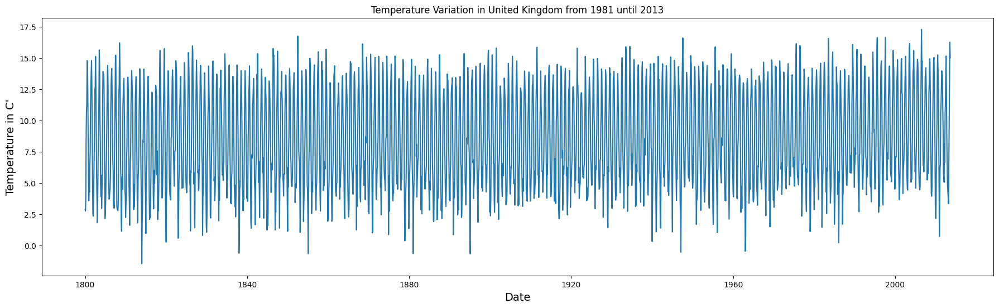

In [13]:
# Temperature Variation in United Kingdom from 1981 until 2013
plt.figure(figsize=(22,6))
sns.lineplot(x=UK_data.index, y=UK_data['Temp'])
plt.title('Temperature Variation in United Kingdom from 1981 until 2013')
plt.xlabel("Date",fontsize=14)
plt.ylabel("Temperature in C'",fontsize=14)
plt.show()

In [14]:
"""
For better analysis and getting more insight on trends and pattern of temperature change in the United Kingdom, 
We will be creating a SpreadSheet/Pivot Table to map temperature change in each month 
"""
pivot = pd.pivot_table(UK_data, values='Temp', index='Month', columns='Year', aggfunc='mean')
pivot

Year,1800,1801,1802,1803,1804,1805,1806,1807,1808,1809,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Month,,,,,,,,,,,,,,,,,,,,,
1,2.873,4.529,2.339,1.803,5.596,2.531,3.782,3.116,3.010,1.123,...,5.390,6.154,4.782,6.661,6.133,3.930,2.156,4.085,5.470,4.354
2,2.750,4.276,3.920,2.934,2.956,3.719,4.277,3.709,2.777,5.284,...,5.283,4.578,4.444,5.882,5.718,4.612,2.836,6.219,5.040,3.773
3,3.693,6.353,5.641,5.425,4.142,5.779,4.503,2.972,3.146,5.485,...,6.384,6.917,4.780,6.882,5.906,6.735,5.798,6.496,8.098,3.351
4,8.425,7.430,7.795,8.178,5.950,6.930,5.545,6.434,5.079,4.477,...,8.701,8.108,7.662,10.263,7.243,9.001,8.221,10.610,6.639,6.789
5,10.695,10.795,9.257,9.145,11.769,8.645,10.645,9.876,12.051,11.134,...,11.176,10.206,10.882,10.725,12.198,11.060,10.105,11.232,10.574,9.605
6,11.346,12.553,12.502,12.023,13.908,11.345,12.781,12.216,12.861,11.975,...,13.794,13.863,14.340,13.469,12.971,13.612,14.049,12.705,11.539,12.826
7,14.792,13.588,12.615,15.641,13.754,13.841,13.692,15.216,16.211,13.049,...,14.198,14.889,17.285,13.861,14.935,14.787,15.245,13.972,13.750,16.260
8,14.724,14.796,15.116,14.360,13.699,14.402,14.163,15.216,14.683,13.372,...,15.598,14.613,14.527,14.222,14.665,15.040,13.989,13.784,15.152,15.022
9,12.221,12.869,12.506,10.359,12.622,12.772,12.294,10.282,11.650,11.098,...,13.316,13.668,14.761,12.610,12.430,13.049,12.762,13.530,12.055,NaN


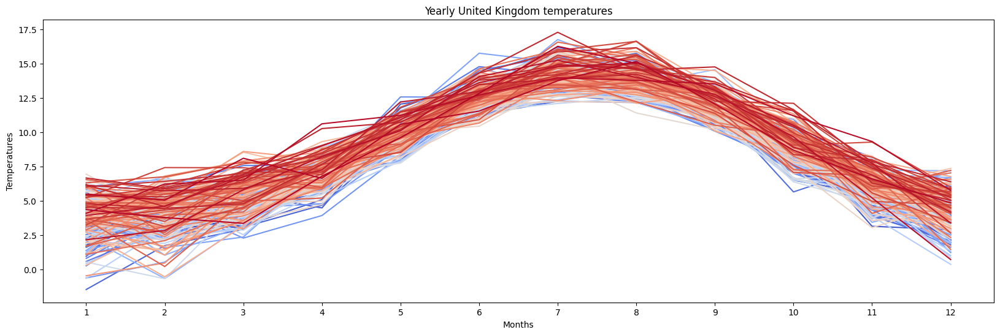

In [15]:
# Yearly United Kingdom temperatures
pivot.plot(figsize=(20,6), 
           colormap="coolwarm")
plt.title('Yearly United Kingdom temperatures')
plt.xlabel('Months')
plt.ylabel('Temperatures')

plt.xticks([x for x in range(1,13)])
plt.legend().remove()
plt.show()

* **It is worth noting that the observed temperature variations follow consistent trends across all months, regardless of the year.**

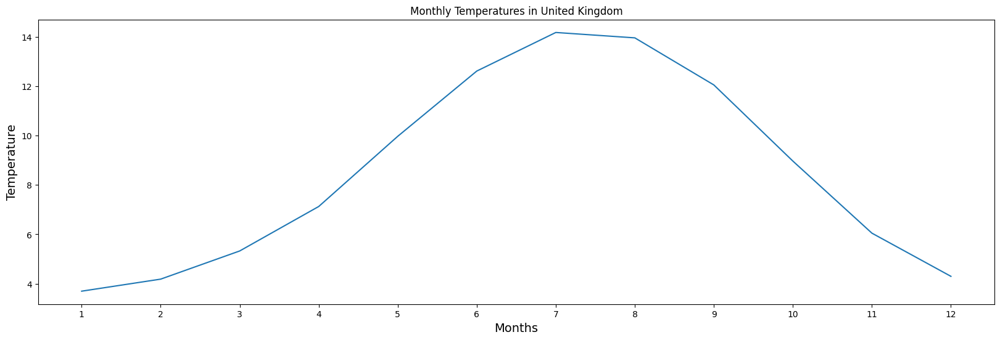

In [16]:
# Monthly Temperatures in United Kingdom
monthly_seasonality = pivot.mean(axis=1)
monthly_seasonality.plot(figsize=(20,6))
plt.title('Monthly Temperatures in United Kingdom')
plt.xlabel('Months',fontsize=14)
plt.ylabel('Temperature',fontsize=14)
plt.xticks([x for x in range(1,13)])

plt.show()

* **Upon analyzing the UK temperature data, it is evident from the plot that there is a noticeable increase in temperatures during the months of June, July, and August, indicating the summer season. Conversely, there is a decline in temperatures during the months of January and December, indicating the winter season.**


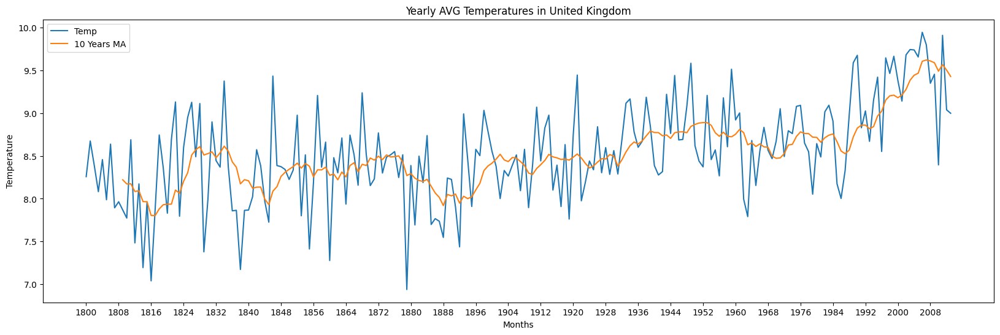

In [17]:
# Yearly AVG Temperatures in United Kingdom
year_avg = pd.pivot_table(UK_data, values='Temp', index='Year', aggfunc='mean')
year_avg['10 Years MA'] = year_avg['Temp'].rolling(10).mean()
year_avg[['Temp','10 Years MA']].plot(figsize=(20,6))
plt.title('Yearly AVG Temperatures in United Kingdom')
plt.xlabel('Months')
plt.ylabel('Temperature')
plt.xticks([x for x in range(1800,2014,8)])
plt.show()

* **After analysing the 10 Years MA values, we can confidently confirm the presence of a consistent increasing trend in the average temperature over the course of 162 years. The data reveals that the average temperature has risen from 8.30º to 9.62º, indicating an increase of approximately 15.90% (approx 16.0%). This substantial temperature rise highlights the long-term impact of climate change on the region.**

In [18]:
average_change = round(max(year_avg['Temp'])-min(year_avg['Temp']), 3)
print(f'The average raise in temperature between {min(year_avg.index)} and {max(year_avg.index)} equal to :',average_change )

The average raise in temperature between 1800 and 2013 equal to : 3.004


In [19]:
print(f"""
=> Therefore, we can conclude that the average raise in temperature between {min(year_avg.index)} and {max(year_avg.index)} was approximately {average_change} degrees Celsius. This represents an overall increase in temperature across the given period, indicating a global warming trend.
""")


=> Therefore, we can conclude that the average raise in temperature between 1800 and 2013 was approximately 3.004 degrees Celsius. This represents an overall increase in temperature across the given period, indicating a global warming trend.



* Additional Visualisation

*Code Source* : [How to plot a Plotly Choropleth map with English local authorities using GeoJSON (Click for Link)](https://stackoverflow.com/questions/72972299/how-to-plot-a-plotly-choropleth-map-with-english-local-authorities-using-geojson)


In [20]:
from urllib.request import urlopen
import json

# Visualize Average Temperature per city 

with urlopen('https://raw.githubusercontent.com/thomasvalentine/Choropleth/main/Local_Authority_Districts_(December_2021)_GB_BFC.json') as response:
    Local_authorities = json.load(response)


la_data = []
# Iterative over JSON
for i in range(len(Local_authorities["features"])):
    # Extract local authority name
    la = Local_authorities["features"][i]['properties']['LAD21NM']
    # Assign the local authority name to a new 'id' property for later linking to dataframe
    Local_authorities["features"][i]['id'] = la
    # While I'm at it, append local authority name to a list to make some dummy data to test, along with i for a value to test on map
    la_data.append([la,i])


# turn dummy data into a dataframe
df = City_data.groupby("City")["AverageTemperature"].mean().reset_index()

fig = px.choropleth_mapbox(df,
                           geojson=Local_authorities,
                           locations='City',
                           color='AverageTemperature',
                           featureidkey="properties.LAD21NM",
                           color_continuous_scale="Viridis",
                           mapbox_style="carto-positron",
                           center={"lat": 55.09621, "lon": -4.0286298},
                           zoom=4.2,
                           labels={'val':'value'})

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

* **The available city data represents a subset of cities in the UK, providing samples from various regions. It is important to note that the dataset does not include data from all cities across the UK. However, it does offer insights into temperature patterns. For instance, the data indicates that cities in the southern region tend to experience higher average temperatures compared to those in the northern region. Cities in the middle region generally exhibit average temperature values that fall between the extremes observed in the north and south.**

## - Handling Data

* Drop rows with missing values

In [21]:
country_data.dropna(inplace=True)

In [22]:
City_data.dropna(inplace=True)

* Dropping Unnecessary Columns

In [23]:
cols = ['AverageTemperatureUncertainty', 'Country']
try: 
    country_data.drop(cols, axis = 1, inplace = True)
except: 
    pass
country_data

,dt,AverageTemperature
552315,1800-01-01,2.873
552316,1800-02-01,2.750
552317,1800-03-01,3.693
552318,1800-04-01,8.425
552319,1800-05-01,10.695
...,...,...
554874,2013-04-01,6.789
554875,2013-05-01,9.605
554876,2013-06-01,12.826
554877,2013-07-01,16.260


# Time Series Analysis

## - Decomposition and Seasonality Analysis

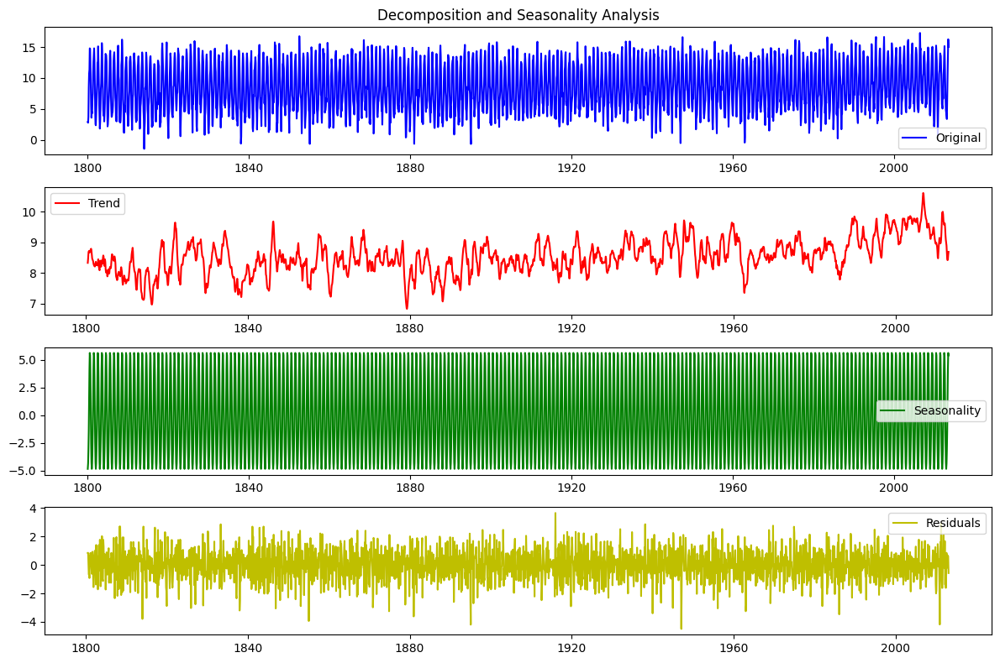

In [24]:
# Perform seasonal decomposition

data = country_data.copy()

# Setting 'Date' column is in datetime format, set it as the index
data['Date'] = pd.to_datetime(data['dt'])
data.set_index('Date', inplace=True)
data.dropna(inplace = True)

# Perform seasonal decomposition
decomposition = seasonal_decompose(data['AverageTemperature'], model='additive')
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot the decomposed components
plt.figure(figsize=(12, 8))
plt.subplot(411)
plt.plot(data['AverageTemperature'], label='Original',color = 'b')
plt.legend(loc='best')
plt.title('Decomposition and Seasonality Analysis')
plt.subplot(412)
plt.plot(trend, label='Trend' ,color = 'r')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal, label='Seasonality',color = 'g')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals',color = 'y')
plt.legend(loc='best')
plt.tight_layout()
plt.show()


## - Stationarity Check & Autocorrelation and Partial Autocorrelation Analysis

*Source* : [Check_Stationarity Function Source](https://www.kaggle.com/code/leandrovrabelo/climate-change-forecast-sarima-model?scriptVersionId=10161879&cellId=19)
 

* For the stationarity check, we will performe it using the `Dickey-Fuller` test (adfuller) from the `statsmodels` library. The test statistics and critical values will be printed, and based on the comparison, a message will be displayed indicating whether the series is stationary or not.

* The autocorrelation and partial autocorrelation analysis will be conducted using the `plot_acf` and `plot_pacf` functions from the `statsmodels` library. These functions will generate plots showing the `autocorrelation` and `partial_autocorrelation` patterns, respectively. 
    * Where the autocorrelation function `(ACF)`:
        * It shows the correlation between the current temperatures versus the lagged versions of itself.
    * And the partial autocorrelation `(PACF)`:
        * It shows the correlation between the current temperatures versus the lagged version excluding the effects of earlier lags, for example, it show the effective influence of the lag 3 in the current temperatures excluding the effects of the lags 1 and 2.

In [25]:
def check_stationarity(y, lags_plots=48, figsize=(22,8)):
    "Use Series as parameter"
    
    # Creating plots of the DF
    y = pd.Series(y)
    fig = plt.figure()

    ax1 = plt.subplot2grid((3, 3), (0, 0), colspan=2)
    ax2 = plt.subplot2grid((3, 3), (1, 0))
    ax3 = plt.subplot2grid((3, 3), (1, 1))
    ax4 = plt.subplot2grid((3, 3), (2, 0), colspan=2)

    y.plot(ax=ax1, figsize=figsize)
    ax1.set_title('United Kingdom Temperature Variation')
    plot_acf(y, lags=lags_plots, zero=False, ax=ax2);
    plot_pacf(y, lags=lags_plots, zero=False, ax=ax3);
    sns.distplot(y, bins=int(sqrt(len(y))), ax=ax4)
    ax4.set_title('Distribution Chart')

    plt.tight_layout()
    
    print('Results of Dickey-Fuller Test:')
    adfinput = adfuller(y)
    adftest = pd.Series(adfinput[0:4], index=['Test Statistic','p-value','Lags Used','Number of Observations Used'])
    adftest = round(adftest,4)
    
    for key, value in adfinput[4].items():
        adftest["Critical Value (%s)"%key] = value.round(4)
        
    print(adftest)

    if adftest[0].round(2) < adftest[5].round(2):
        print('\nThe Test Statistics is lower than the Critical Value of 5%.\nThe serie seems to be stationary')
    else:
        print("\nThe Test Statistics is higher than the Critical Value of 5%.\nThe serie isn't stationary")

Results of Dickey-Fuller Test:
Test Statistic                   -5.1491
p-value                           0.0000
Lags Used                        24.0000
Number of Observations Used    2539.0000
Critical Value (1%)              -3.4329
Critical Value (5%)              -2.8627
Critical Value (10%)             -2.5674
dtype: float64

The Test Statistics is lower than the Critical Value of 5%.
The serie seems to be stationary


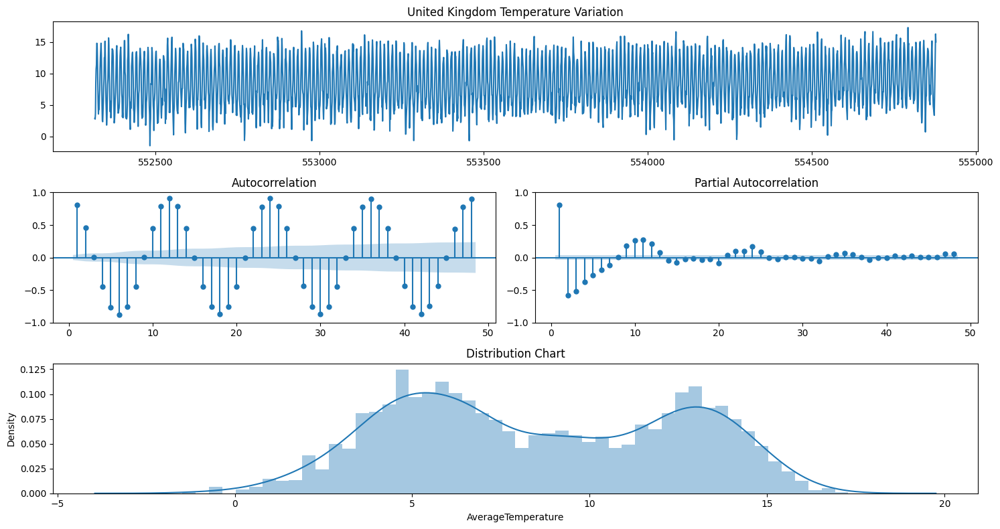

In [26]:
check_stationarity(country_data['AverageTemperature'])

Results of Dickey-Fuller Test:
Test Statistic                  -2.0505
p-value                          0.2649
Lags Used                        6.0000
Number of Observations Used    207.0000
Critical Value (1%)             -3.4623
Critical Value (5%)             -2.8756
Critical Value (10%)            -2.5743
dtype: float64

The Test Statistics is higher than the Critical Value of 5%.
The serie isn't stationary


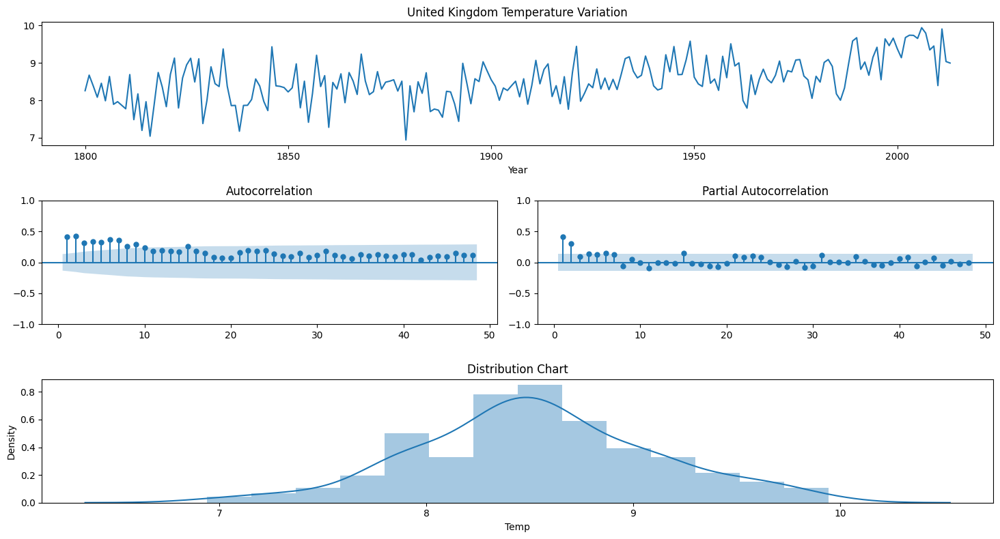

In [27]:
check_stationarity(year_avg['Temp'])

Based on the Dickey-Fuller test results for the monthly and yearly temperature datasets, we can draw the following conclusions:

* **Monthly Temperature Dataset:**
The test statistic (-5.1491) is lower than the critical value at a 5% significance level (-2.8627). This suggests that we can reject the null hypothesis of non-stationarity. Therefore, the monthly temperature series appears to be stationary. Stationarity indicates that the statistical properties of the series, such as mean and variance, do not change significantly over time.


* **Yearly Temperature Dataset:**
The test statistic (-2.0505) is higher than the critical value at a 5% significance level (-2.8756). This indicates that we fail to reject the null hypothesis of non-stationarity. Hence, the yearly temperature series is not stationary. The non-stationarity suggests that the statistical properties of the series vary over time, such as the mean and variance changing.


* **General Conclusion:**
The monthly temperature series is stationary, while the yearly temperature series is non-stationary. This implies that the monthly temperatures exhibit consistent statistical patterns over time, making them potentially easier to model and forecast. On the other hand, the yearly temperatures show more variability and may require additional techniques, such as differencing or seasonal adjustment, to achieve stationarity before modeling.

**Impact on Prediction Models:**

* The stationarity of a time series can affect the performance of prediction models. In the case of stationary data, models can capture and utilize the consistent patterns and statistical properties to make accurate predictions. However, with non-stationary data, models may struggle to capture the changing dynamics and trends, leading to less reliable predictions.

* For the monthly temperature series, being stationary suggests that it may be suitable for various time series forecasting models, such as ARIMA, SARIMA, or machine learning models like LSTM. These models can leverage the stationary properties to capture patterns and make accurate predictions.

* For the yearly temperature series, due to its non-stationarity, additional steps may be required to preprocess the data and make it stationary before modeling. In addition, suitable models with the right parameters can be used for better forecasting.

In summary, understanding the stationarity properties of the time series data is crucial for selecting appropriate modeling techniques and ensuring reliable predictions.

# Forecasting Models

4. [Forecasting Models](#forecasting-models)
   - Baseline Model: Moving Average
   - Basic Models : Machine Learning Regression Models
   - Advanced Models:
     - Autoregressive Integrated Moving Average (ARI MA)
     - Seasonal Autoregressive Integrated Moving Average (SARIMA)
     - Convolutional Neural Network (CNN)
     - Long Short-Term Memory (LSTM) Network

## - Baseline Model: Moving Average

* Make a copy of the dataset to perform the modifications on and split it for training and testing, we will have two copies: 
    - One with monthly temperatures 
    - Second with yearly average temperatures

In [28]:
data_1 = country_data.copy()
data_1.set_index('dt', inplace=True)
data_2 = year_avg[['Temp']].copy()

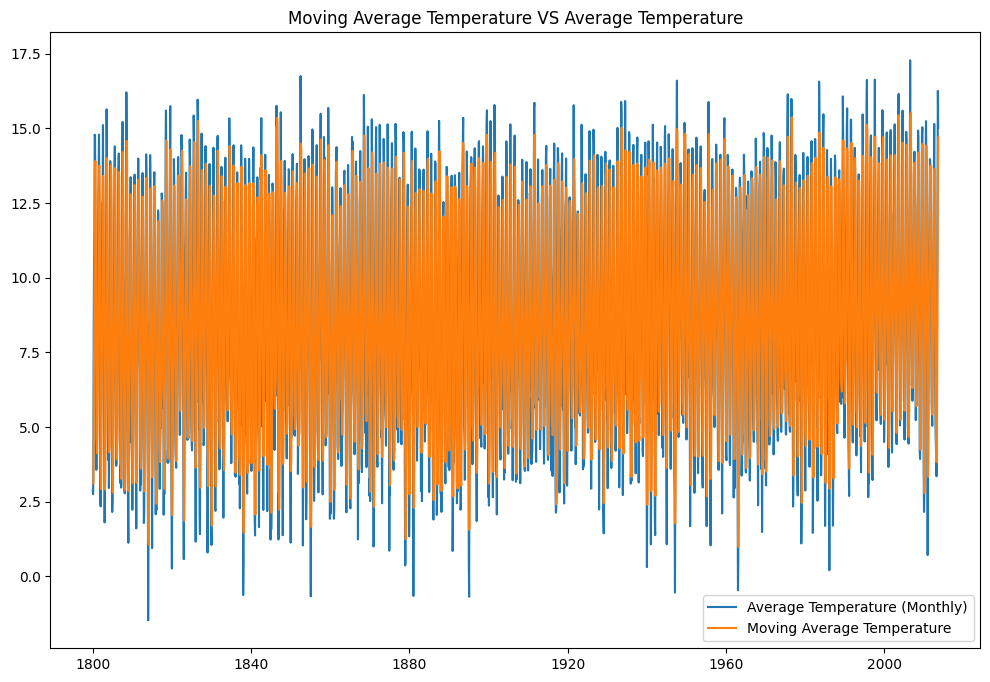

In [29]:
# Calculate and ploting moving average
window_size = 3
moving_avg = data_1['AverageTemperature'].rolling(window_size).mean()
moving_avg
plt.figure(figsize=(12, 8))
plt.plot(data_1['AverageTemperature'], label='Average Temperature (Monthly)')
plt.plot(moving_avg, label='Moving Average Temperature')
plt.title('Moving Average Temperature VS Average Temperature')
plt.legend()
plt.show()

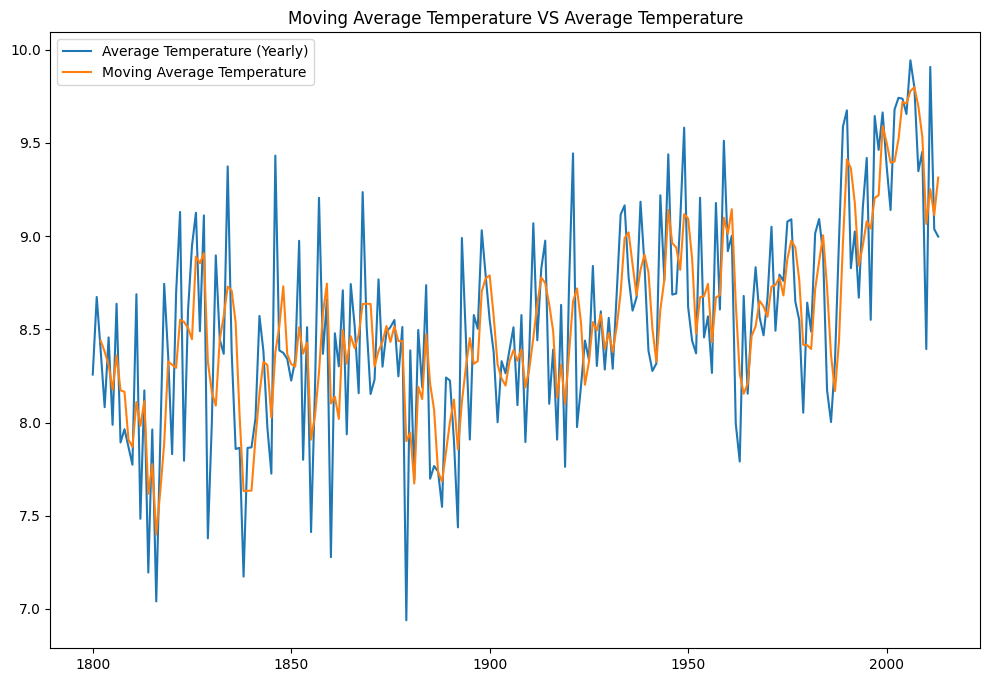

In [30]:
# Calculate and ploting moving average
window_size = 3
moving_avg = data_2['Temp'].rolling(window_size).mean()
moving_avg
plt.figure(figsize=(12, 8))
plt.plot(data_2['Temp'], label='Average Temperature (Yearly)')
plt.plot(moving_avg, label='Moving Average Temperature')
plt.title('Moving Average Temperature VS Average Temperature')
plt.legend()
plt.show()

## - Basic Models : Machine Learning Regression Models

* Before we deep dive into **Forecasting using time series analysis**, let's define it first and understand how it works. 

   - Forecasting using time series analysis refers to the process of predicting future values or trends of a variable based on historical patterns and dependencies within the data. It involves analyzing the temporal structure of a time series to make informed predictions about its future behavior.

   - Time series forecasting takes into account the inherent characteristics of time-dependent data, such as trend, seasonality, cyclicality, and random fluctuations. By identifying and modeling these patterns, forecasting models can estimate future values or make projections within a given confidence interval.
    
   - Time series forecasting is widely used in various domains, including finance, economics, sales, supply chain management, and weather forecasting. It helps organizations and individuals make informed decisions, plan for the future, allocate resources effectively, and respond to changing conditions based on predicted trends and patterns in the time series data.

**Models Overview**

Starting with a brief explanation of each selected model and why they can be suitable for forecasting time series:

1. **Random Forest Regressor:**
Random Forest is an ensemble learning algorithm that combines multiple decision trees to make predictions. In the case of regression, the Random Forest Regressor averages the predictions from each tree to obtain the final prediction. It is suitable for time series forecasting due to its ability to capture non-linear relationships, handle complex interactions between variables, and handle missing data effectively. Random Forests can also handle a large number of features, making them useful for time series datasets with multiple input variables.
<div style="text-align:center">
    <img src="https://media.geeksforgeeks.org/wp-content/uploads/20200516180708/Capture482.png" alt="alt text" width="500px">
    <b>Random Forest Regressor</b>
</div>

1. **Linear Regression:**
Linear Regression is a simple and widely used statistical technique for predicting a numeric response variable based on one or more predictor variables. It assumes a linear relationship between the predictors and the response. Linear Regression is suitable for time series forecasting when the relationship between the target variable and predictors can be adequately represented by a linear function. It is particularly useful when there is a clear trend or linear pattern in the time series data.
<div style="text-align:center">
    <img src="https://miro.medium.com/v2/resize:fit:2584/1*Nf2tTTkALYq6RTMQmhjo1A.png" alt="alt text" width="500px">
    <b>Linear Regression</b>
</div>

1. **Support Vector Regression (SVR):**
SVR is a regression algorithm that uses support vector machines to perform non-linear regression. It aims to find a hyperplane that has the maximum margin and best fits the data. SVR is suitable for time series forecasting because it can handle non-linear relationships and capture complex patterns in the data. By using kernel functions, SVR can transform the input features to higher-dimensional spaces, allowing for more flexible modeling. SVR is particularly useful when dealing with data that has non-linear trends or complex interactions.
<div style="text-align:center">
    <img src="https://www.saedsayad.com/images/SVR_2.png" alt="alt text" width="500px">
    <b>Support Vector Regression</b>
</div>


In conslusion, Random Forest Regressor, Linear Regression, and SVR are suitable for time series forecasting due to their ability to capture different types of relationships, handle complex patterns, and provide accurate predictions. The choice of the model depends on the specific characteristics of the time series data and the desired modeling approach.

For evaluation metrics, we choosed MAE and MSE where: 
* **Mean Absolute Error (MAE)** is the metric that measures the average absolute difference between the predicted values and the actual values. It gives equal weight to all errors, regardless of their direction. The MAE value represents the average magnitude of the errors, and a lower MAE indicates that the model has made, on average, smaller absolute errors in its predictions.

* **Mean Squared Error (MSE)** is the metric that calculates the average squared difference between the predicted values and the actual values. Squaring the errors gives more weight to larger errors compared to MAE. A lower MSE value indicates that the model has made, on average, smaller squared errors in its predictions.

<div style="text-align:center">
    <img src="https://4.bp.blogspot.com/-wG7IbjTfE6k/XGUvqm7TCVI/AAAAAAAAAZU/vpH1kuKTIooKTcVlnm1EVRCXLVZM9cPNgCLcBGAs/s1600/formula-MAE-MSE-RMSE-RSquared.JPG " alt="alt text" width="400px" height="600px">
    <b>MAE & MSE formulas Overview</b>
</div>

Both MAE and MSE provide a numerical measure of the model's accuracy and can be used to compare the performance of different forecasting models.

* Data transformation for Forecasting

In [31]:
# This function is used to transform a time series dataset into a supervised learning dataset
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols = list()
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
    for i in range(0, n_out):
        cols.append(df.shift(-i))
    agg = pd.concat(cols, axis=1)
    if dropnan:
        agg.dropna(inplace=True)
    return agg.values

###  + Training using Monthly Dataset

* Data preparation

In [32]:
# Build Training data
series = data_1[['AverageTemperature']].dropna()
values = series.values
t_data = series_to_supervised(values, n_in=6)

In [33]:
# Split data for training and testing (70% for training + 30% for testing)
trainX, trainy = t_data[:int(len(t_data) * 0.7), :-1], t_data[:int(len(t_data)* 0.7), -1]
testX, testy = t_data[int(len(t_data) * 0.7):, :-1], t_data[int(len(t_data) * 0.7):, -1]
print("Training data length :",len(trainX))
print("Testing data length :",len(testX))

# These sets just for visualisation 
t_data = pd.DataFrame({"AverageTemperature" : t_data[:, -1]})
train, test = t_data.iloc[:int(len(t_data) * 0.7)], t_data.iloc[int(len(t_data) * 0.7):]

Training data length : 1790
Testing data length : 768


In [34]:
results = {"Models" : [], "MAE" : [], "MSE" : []} # For monthly
results_ = {"Models" : [], "MAE" : [], "MSE" : []} # For yearly

* Train and evaluate **Random Forest Regressor** Model

In [35]:
# Build & Fit model
model = RandomForestRegressor(n_estimators = 1000)
model.fit(trainX, trainy)
# Make predictions
yhat = model.predict(testX)
test["Predicted"] = yhat
print('Input: %s, Predicted: %.3f' % (testX[-1], yhat[-1]))
# Model evaluation
print("MAE for the Random Forest Regressor Model=",round(mean_absolute_error(testy,yhat),2))
print("MSE for the Random Forest Regressor Model=",round(mean_squared_error(testy,yhat),2))
results['Models'].append("RandomForestRegressor (Monthly)")
results['MAE'].append(round(mean_absolute_error(testy,yhat),2))
results['MSE'].append(round(mean_squared_error(testy,yhat),2))

Input: [ 3.773  3.351  6.789  9.605 12.826 16.26 ], Predicted: 14.194
MAE for the Random Forest Regressor Model= 1.07
MSE for the Random Forest Regressor Model= 1.8


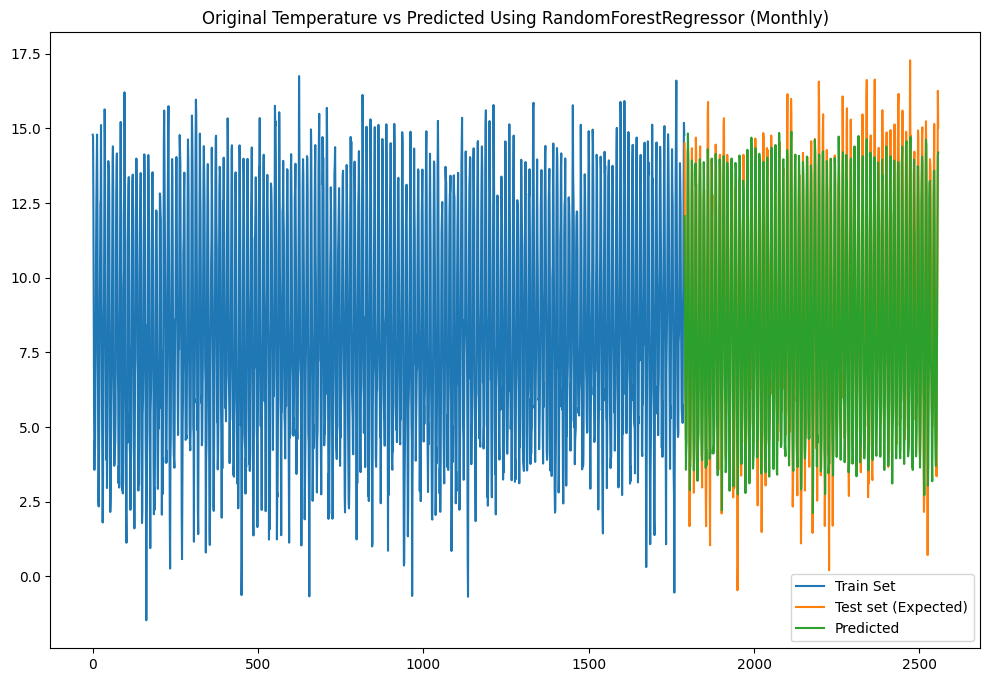

In [36]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using RandomForestRegressor (Monthly)")
plt.legend()
plt.show()

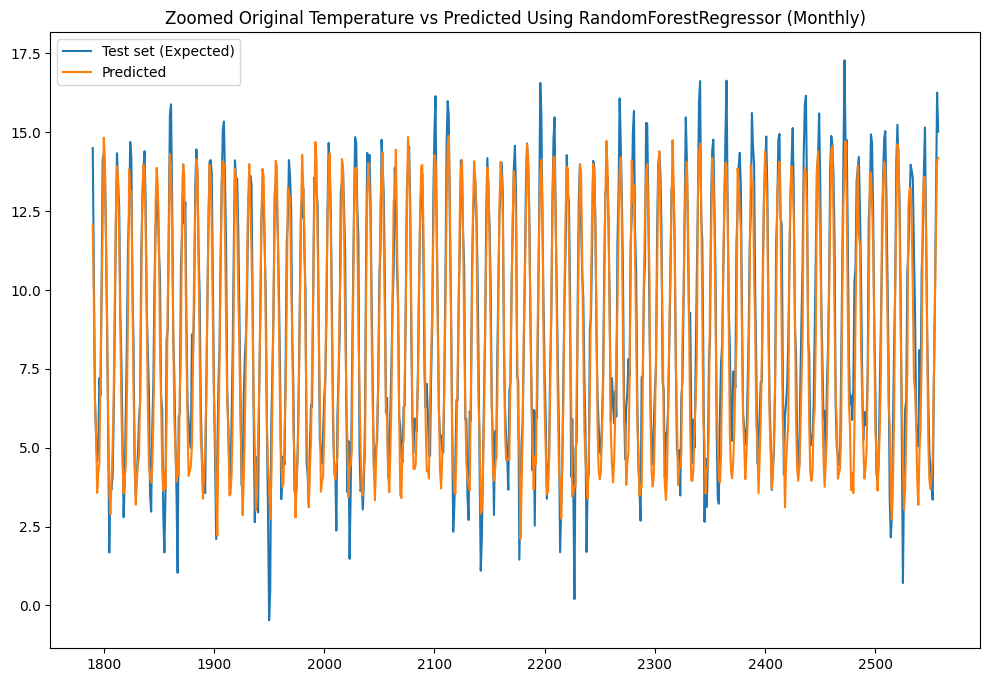

In [37]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using RandomForestRegressor (Monthly)")
plt.legend()
plt.show()

* Train and evaluate **Linear Regression** Model

In [38]:
# Build & fit model
model = LinearRegression()
model.fit(trainX, trainy)
# Make predictions
yhat = model.predict(testX)
test["Predicted"] = yhat
print('Input: %s, Predicted: %.3f' % (testX[-1], yhat[-1]))
# Model Evaluation
print("MAE for the LinearRegression Model=",round(mean_absolute_error(testy,yhat),2))
print("MSE for the LinearRegression Model=",round(mean_squared_error(testy,yhat),2))
results['Models'].append("LinearRegression (Monthly)")
results['MAE'].append(round(mean_absolute_error(testy,yhat),2))
results['MSE'].append(round(mean_squared_error(testy,yhat),2))

Input: [ 3.773  3.351  6.789  9.605 12.826 16.26 ], Predicted: 15.088
MAE for the LinearRegression Model= 1.15
MSE for the LinearRegression Model= 2.02


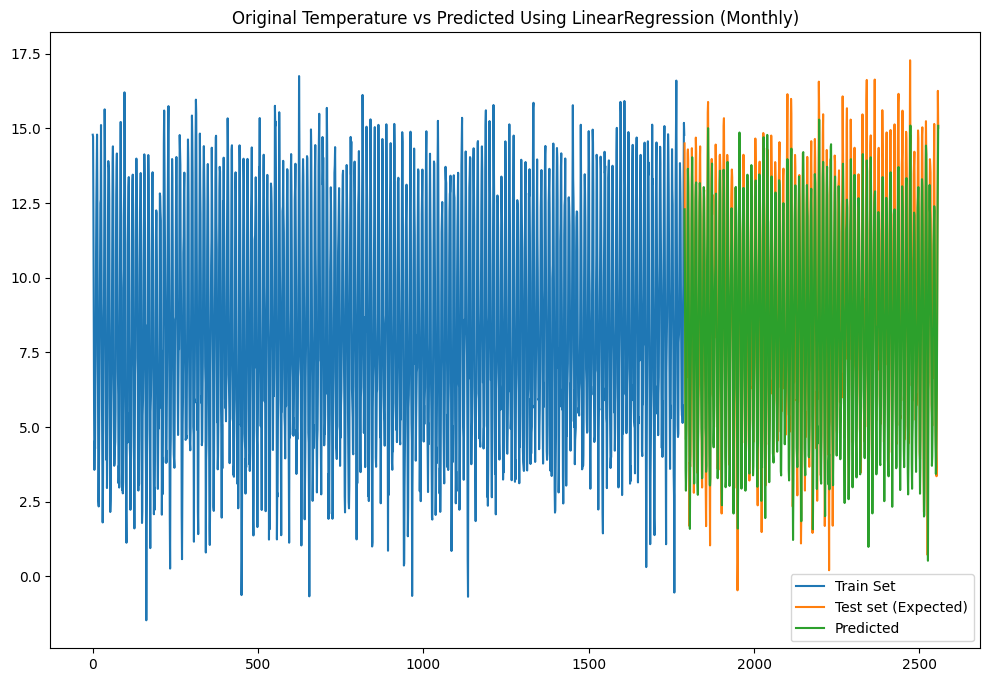

In [39]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using LinearRegression (Monthly)")
plt.legend()
plt.show()

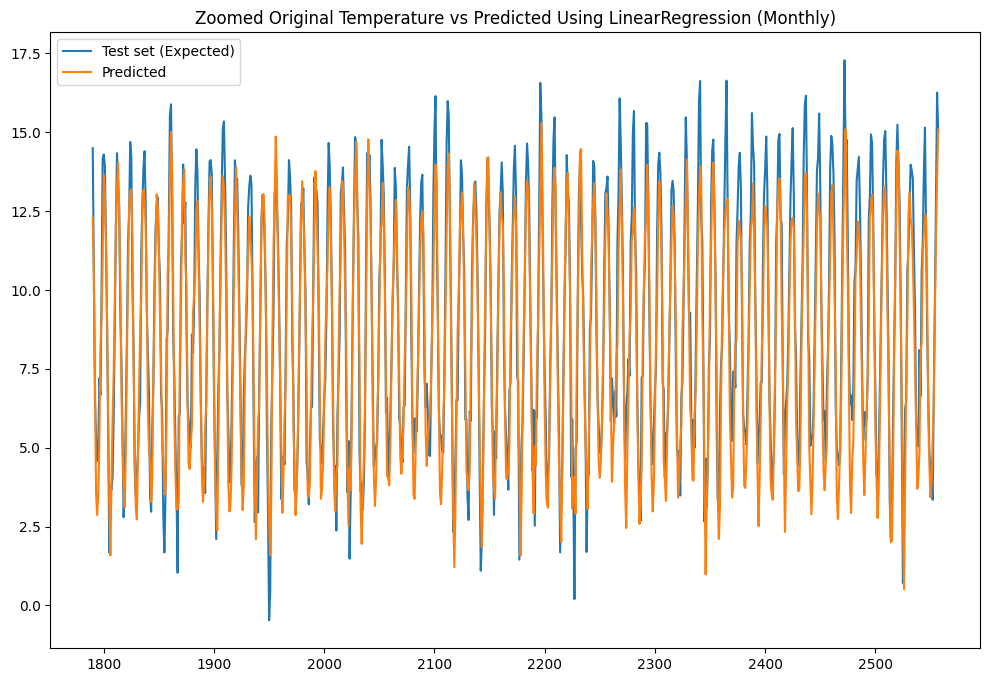

In [40]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using LinearRegression (Monthly)")
plt.legend()
plt.show()

* Train and evaluate **SVM Regressor (SVR)** Model

In [41]:
# Build & fit model
model = SVR()
model.fit(trainX, trainy)
# Make predictions
yhat = model.predict(testX)
test["Predicted"] = yhat
print('Input: %s, Predicted: %.3f' % (testX[-1], yhat[-1]))
# Model evaluation
print("MAE for the SVR Model=",round(mean_absolute_error(testy,yhat),2))
print("MSE for the SVR Model=",round(mean_squared_error(testy,yhat),2))
results['Models'].append("SVR (Monthly)")
results['MAE'].append(round(mean_absolute_error(testy,yhat),2))
results['MSE'].append(round(mean_squared_error(testy,yhat),2))

Input: [ 3.773  3.351  6.789  9.605 12.826 16.26 ], Predicted: 14.219
MAE for the SVR Model= 0.99
MSE for the SVR Model= 1.55


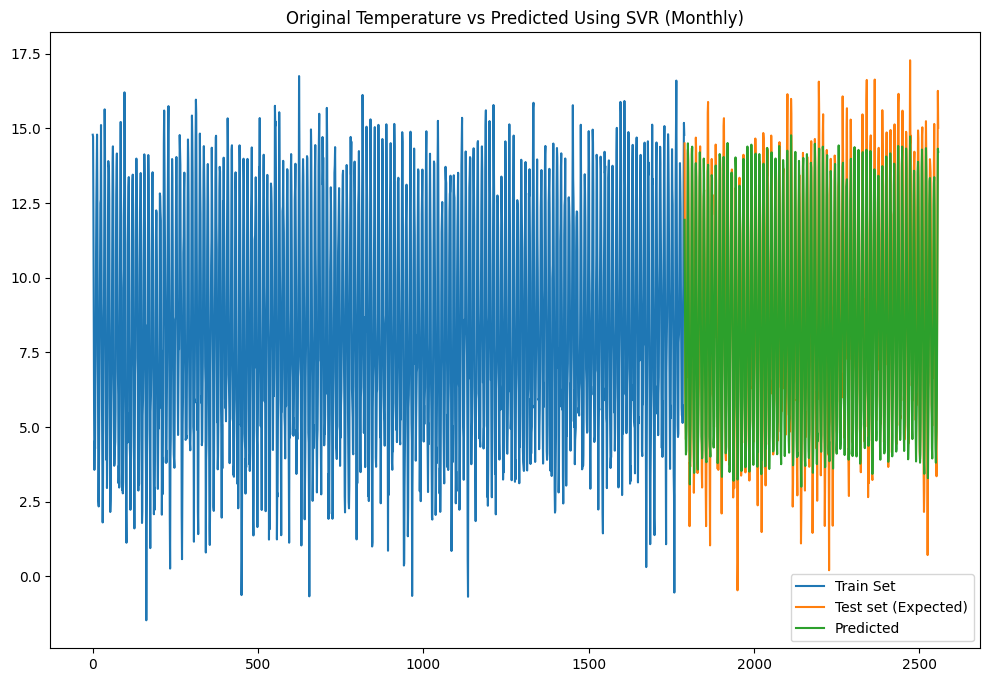

In [42]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using SVR (Monthly)")
plt.legend()
plt.show()

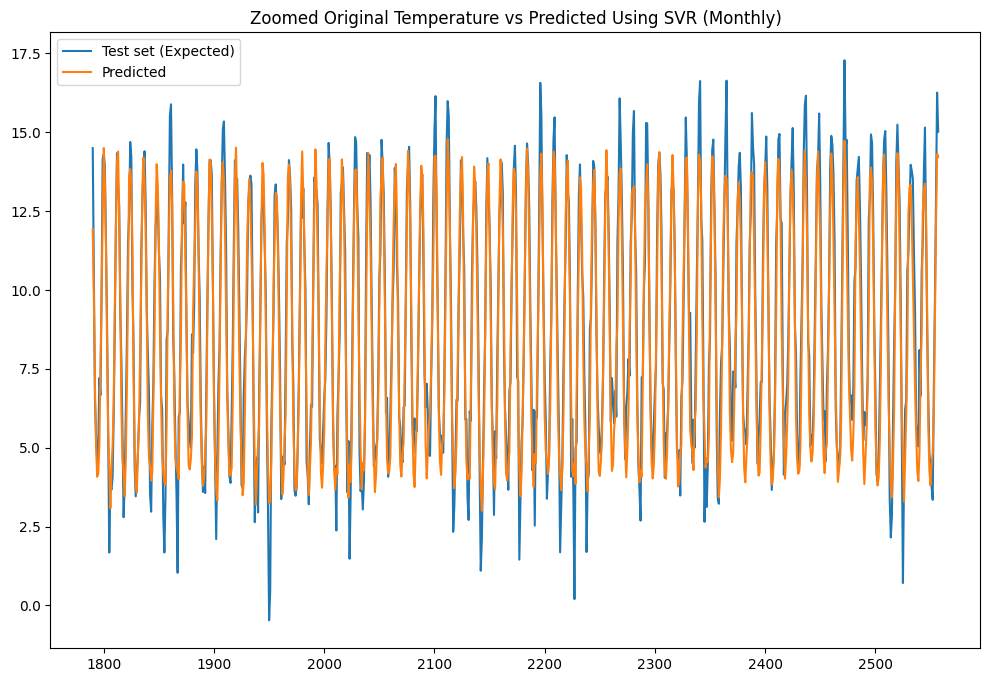

In [43]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using SVR (Monthly)")
plt.legend()
plt.show()

* Models Evaluation and Comparison

In [44]:
pd.DataFrame(results)

,Models,MAE,MSE
0,RandomForestRegressor (Monthly),1.07,1.80
1,LinearRegression (Monthly),1.15,2.02
2,SVR (Monthly),0.99,1.55


In [45]:
# Create the figure
fig = go.Figure()

# Add the MAE line
fig.add_trace(go.Bar(
    x=results["Models"],
    y=results["MAE"],
    text=results["MAE"],
    name='MAE'
))

# Add the MSE line
fig.add_trace(go.Bar(
    x=results["Models"],
    y=results["MSE"],
    text=results["MSE"],
    name='MSE'
))

# Update the layout
fig.update_layout(
    title='Models MAE and MSE Comparison',
    xaxis_title='Models',
    yaxis_title='Error',
    barmode='group'  # Display bars in groups
)

fig.show()

* For both Mean Absolute Error (MAE) and Mean Squared Error (MSE), lower values indicate better performance. So based on these results, we have the SVR seems to be the best model when looking at the final MAE and MSE values.

###  + Training using Yearly Dataset

* Data preparation

In [46]:
# Build Training data
series = data_2[['Temp']].dropna()
values = series.values
t_data = series_to_supervised(values, n_in=20)

In [47]:
# Split data for training and testing (70% for training + 30% for testing)
trainX, trainy = t_data[:int(len(t_data) * 0.7), :-1], t_data[:int(len(t_data)* 0.7), -1]
testX, testy = t_data[int(len(t_data) * 0.7):, :-1], t_data[int(len(t_data) * 0.7):, -1]
print("Training data length :",len(trainX))
print("Testing data length :",len(testX))

# These sets just for visualisation 
t_data = pd.DataFrame({"AverageTemperature" : t_data[:, -1]})
train, test = t_data.iloc[:int(len(t_data) * 0.7)], t_data.iloc[int(len(t_data) * 0.7):]

Training data length : 135
Testing data length : 59


* Train and evaluate **RandomForestRegressor** Model

In [48]:
# Build & fit model
model = RandomForestRegressor()
model.fit(trainX, trainy)
# Make predictions
yhat = model.predict(testX)
test["Predicted"] = yhat
print('Input: %s, Predicted: %.3f' % (testX[-1], yhat[-1]))
# Model Evaluation
print("\nMAE for the Random Forest Regressor Model=",round(mean_absolute_error(testy,yhat),2))
print("MSE for the Random Forest Regressor Model=",round(mean_squared_error(testy,yhat),2))
results_['Models'].append("RandomForestRegressor (yealry)")
results_['MAE'].append(round(mean_absolute_error(testy,yhat),2))
results_['MSE'].append(round(mean_squared_error(testy,yhat),2))

Input: [8.66975    9.15075    9.41958333 8.55116667 9.64425    9.46275
 9.66333333 9.37966667 9.14008333 9.67966667 9.74208333 9.73733333
 9.65525    9.94341667 9.7975     9.34825    9.45333333 8.39433333
 9.90791667 9.03741667], Predicted: 8.871

MAE for the Random Forest Regressor Model= 0.48
MSE for the Random Forest Regressor Model= 0.34


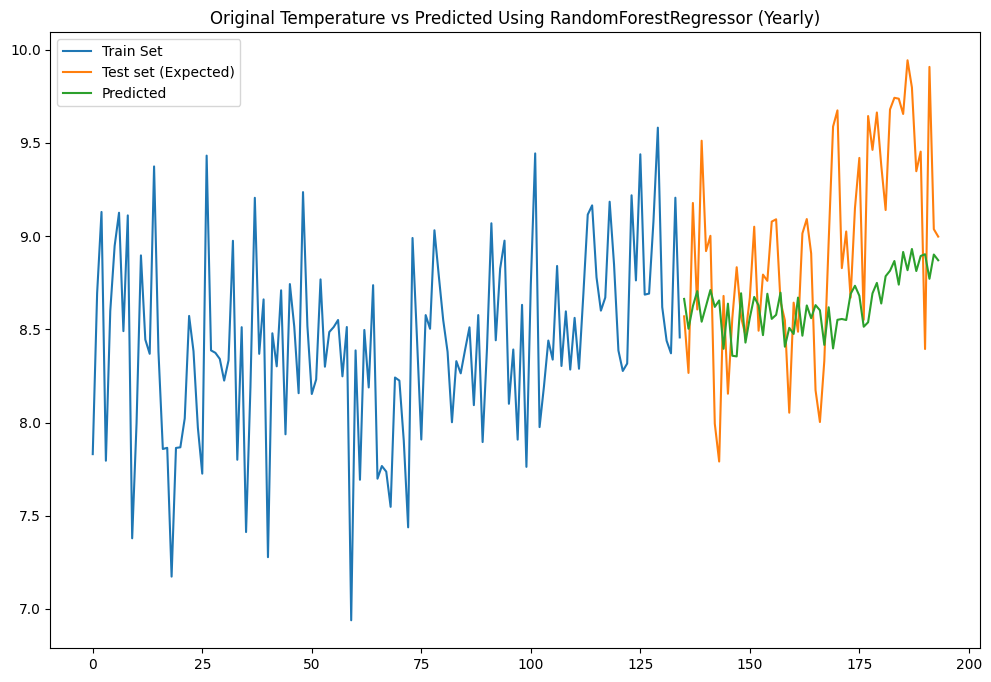

In [49]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using RandomForestRegressor (Yearly)")
plt.legend()
plt.show()

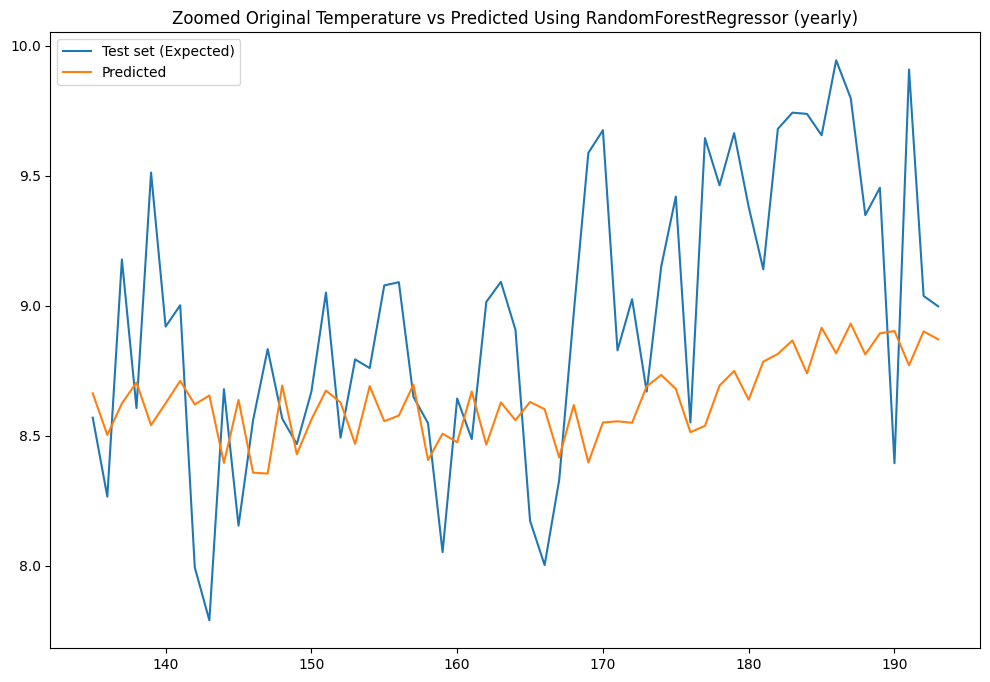

In [50]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using RandomForestRegressor (yearly)")
plt.legend()
plt.show()

* Train and evaluate **LinearRegression** Model

In [51]:
# Build & fit model
model = LinearRegression()
model.fit(trainX, trainy)
# Make predictions
yhat = model.predict(testX)
test["Predicted"] = yhat
print('Input: %s, Predicted: %.3f' % (testX[-1], yhat[-1]))
# Model Evaluation
print("\nMAE for the LinearRegression Model=",round(mean_absolute_error(testy,yhat),2))
print("MSE for the LinearRegression Model=",round(mean_squared_error(testy,yhat),2))
results_['Models'].append("LinearRegression (yealry)")
results_['MAE'].append(round(mean_absolute_error(testy,yhat),2))
results_['MSE'].append(round(mean_squared_error(testy,yhat),2))

Input: [8.66975    9.15075    9.41958333 8.55116667 9.64425    9.46275
 9.66333333 9.37966667 9.14008333 9.67966667 9.74208333 9.73733333
 9.65525    9.94341667 9.7975     9.34825    9.45333333 8.39433333
 9.90791667 9.03741667], Predicted: 8.913

MAE for the LinearRegression Model= 0.45
MSE for the LinearRegression Model= 0.31


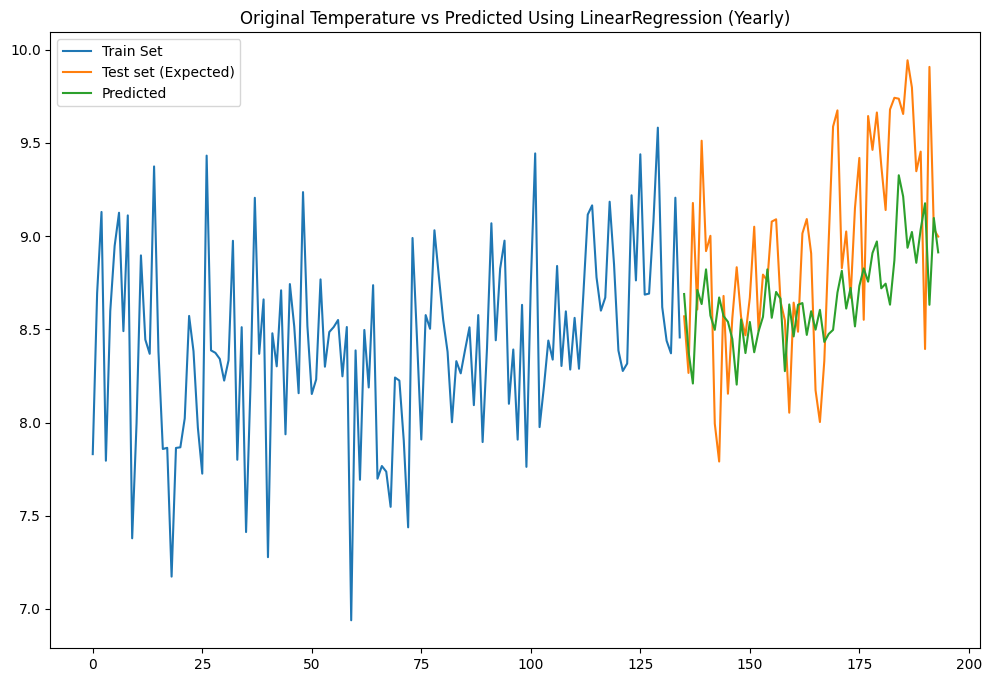

In [52]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using LinearRegression (Yearly)")
plt.legend()
plt.show()

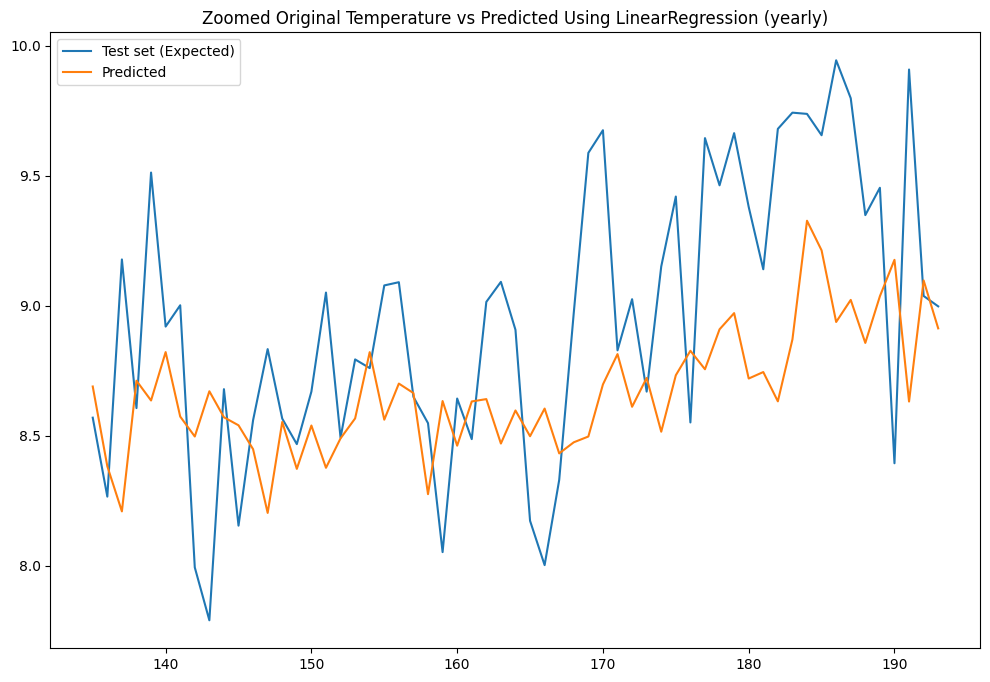

In [53]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using LinearRegression (yearly)")
plt.legend()
plt.show()

* Train and evaluate **SVM Regressor (SVR)** Model

In [54]:
# Build & fit model
model = SVR()
model.fit(trainX, trainy)
# MMake predictions
yhat = model.predict(testX)
test["Predicted"] = yhat
print('Input: %s, Predicted: %.3f' % (testX[-1], yhat[-1]))
# Model Evaluation
print("\nMAE for the SVR Model=",round(mean_absolute_error(testy,yhat),2))
print("MSE for the SVR Model=",round(mean_squared_error(testy,yhat),2))
results_['Models'].append("SVR (yealry)")
results_['MAE'].append(round(mean_absolute_error(testy,yhat),2))
results_['MSE'].append(round(mean_squared_error(testy,yhat),2))

Input: [8.66975    9.15075    9.41958333 8.55116667 9.64425    9.46275
 9.66333333 9.37966667 9.14008333 9.67966667 9.74208333 9.73733333
 9.65525    9.94341667 9.7975     9.34825    9.45333333 8.39433333
 9.90791667 9.03741667], Predicted: 8.498

MAE for the SVR Model= 0.52
MSE for the SVR Model= 0.42


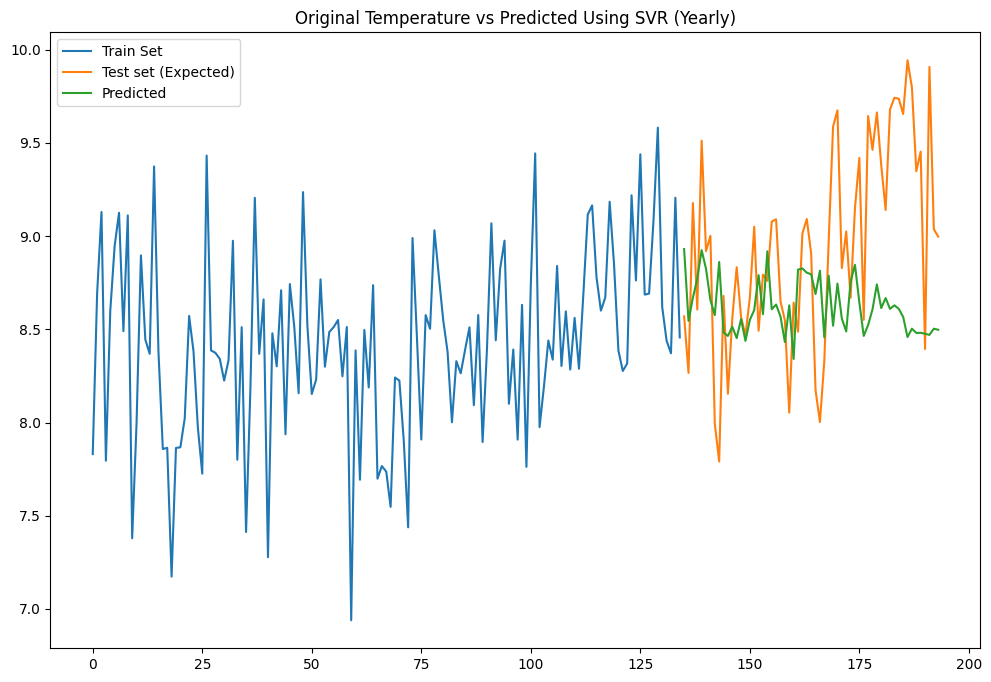

In [55]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using SVR (Yearly)")
plt.legend()
plt.show()

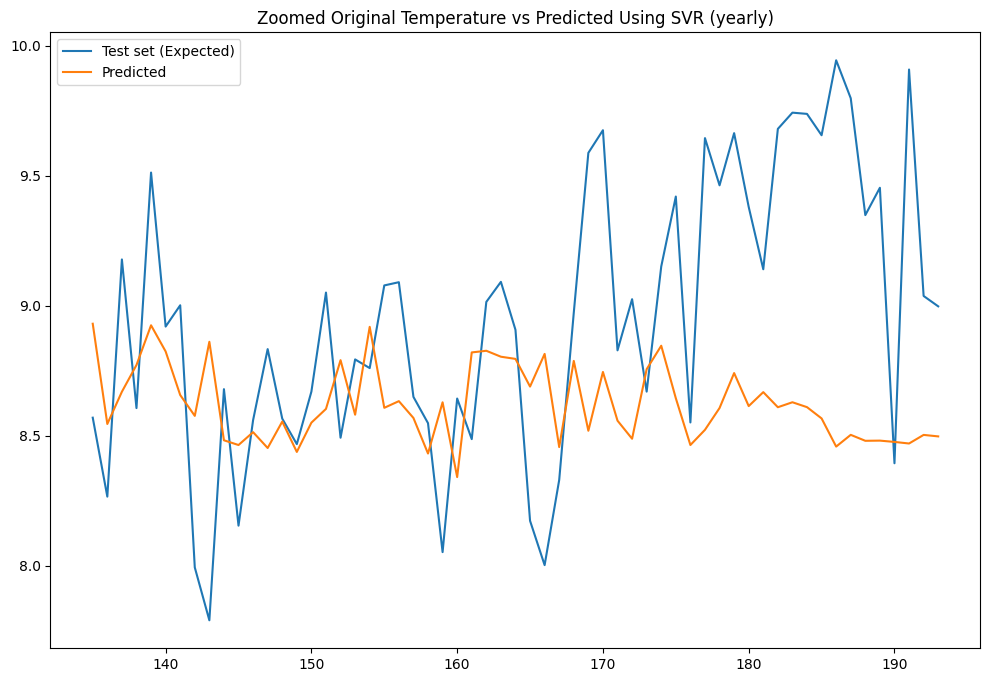

In [56]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using SVR (yearly)")
plt.legend()
plt.show()

* Models Evaluation

In [57]:
pd.DataFrame(results_)

,Models,MAE,MSE
0,RandomForestRegressor (yealry),0.48,0.34
1,LinearRegression (yealry),0.45,0.31
2,SVR (yealry),0.52,0.42


In [58]:
# Create the figure
fig = go.Figure()

# Add the MAE line
fig.add_trace(go.Bar(
    x=results_["Models"],
    y=results_["MAE"],
    text=results_["MAE"],
    name='MAE'
))

# Add the MSE line
fig.add_trace(go.Bar(
    x=results_["Models"],
    y=results_["MSE"],
    text=results_["MSE"],
    name='MSE'
))

# Update the layout
fig.update_layout(
    title='Models MAE and MSE Comparison',
    xaxis_title='Models',
    yaxis_title='Error',
    barmode='group'  # Display bars in groups
)

fig.show()

* Despite the lower MAE and MSE, also the more  training features, the models doesn't seems to train as expected and that's maybe because of the less amount of training data we have for the yearly training, but overall the best model seems to be the LinearRegression one with lowest MAE and MSEDespite achieving lower MAE and MSE values, the models are not performing as expected. One possible reason for this underperformance could be the limited amount of training data available for yearly training. Since forecasting models often benefit from larger training datasets, the scarcity of data may be hindering their performance. However, among the models tested, LinearRegression demonstrates the best performance with the lowest MAE and MSE values. 

## - Advanced Models

* Below is a brief explanation about ARIMA models: from [Explanation about ARIMA models](https://www.kaggle.com/code/leandrovrabelo/climate-change-forecast-sarima-model?scriptVersionId=10161879&cellId=4)

# <font color=green>SARIMA Model (p, d, q)(P, D, Q, S)</font>:
SARIMA stands for Seasonal Auto Regressive Integrated Moving Average, The name scares, but this is not as scary as it seems.

## <font color=green>Non seasonal ARIMA</font>:

We can split the Arima term into three terms, AR, I, MA:

 * **AR(p)** stands for *autoregressive model*, the `p` parameter is an integer that confirms how many lagged series are going to be used to forecast periods ahead, example:
     * The average temperature of yesterday has a high correlation with the temperature of today, so we will use AR(1) parameter to forecast future temperatures.
     * The formula for the AR(p) model is: $\hat{y}_{t} = \mu + \theta_{1}Y_{t-1} + ... + \theta_{p}Y_{t-p}$ Where $\mu$ is the constant term, the **p** is the periods to be used in the regression and $\theta$ is the parameter fitted to the data.
     
 * **I(d)** is the differencing part, the `d` parameter tells how many differencing orders are going to be used, it tries to make the series stationary, example:
 
     * Yesterday I sold 10 items of a product, today I sold 14, the "I" in this case is just the first difference, which is +4, if you are using logarithm base this difference is equivalent to percentual difference. 
     * If d = 1: $y_{t} = Y_{t} - Y_{t-1}$ where $y_{t}$ is the differenced series and $Y_{t-period}$ is the original series
     * If d = 2: $y_{t} = (Y_{t} - Y_{t-1}) - (Y_{t-1} - Y_{t-2}) = Y_{t} - 2Y_{t-1} + Y_{t-2}$
     * Note that the second difference is a change-in-change, which is a measure of the local "acceleration" rather than trend.

* **MA(q)** stands for *moving average model*, the `q` is the number of lagged forecast errors terms in the prediction equation, example:
     * It's strange, but this MA term takes a percentage of the errors between the predicted value against the real. It assumes that the past errors are going to be similar in future events.
     * The formula for the MA(p) model is: $\hat{y}_{t} = \mu - \Theta_{1}e_{t-1} + ... + \Theta_{q}e_{t-q}$ Where $\mu$ is the constant term, **q** is the period to be used on the $e$ term and $\Theta$ is the parameter fitted to the errors
     * The error equation is $ e_{t} = Y_{t-1} - \hat{y}_{t-1}$
     
## <font color=green>Seasonal ARIMA</font>:

The **p, d, q** parameters are capitalized to differ from the non seasonal parameters.

* **SAR(P)** is the seasonal autoregression of the series.
    * The formula for the SAR(P) model is: $\hat{y}_{t} = \mu + \theta_{1}Y_{t-s}$ Where P is quantity of autoregression terms to be added, usually no more than 1 term, **s** is how many periods ago to be used as base and $\theta$ is the parameter fitted to the data.
    * Usually when the subject is weather forecasting, 12 months ago have some information to contribute to the current period.
    * Setting P=1 (i.e., SAR(1)) adds a multiple of $Y_{t-s}$ to the forecast for $y_{t}$
    
* **I(D)** the seasonal difference MUST be used when you have an strong and stable pattern.
     * If d = 0 and D = 1: $y_{t} = Y_{t} - Y_{t-s}$ where $y_{t}$ is the differenced series and $Y_{t-s}$ is the original seasonal lag.
     * If d =1 and D = 1: $y_{t} = (Y_{t} - Y_{t-1}) - (Y_{t-s} - Y_{t-s-1}) = Y_{t} - Y_{t-1} -Y_{t-s} + Y_{t-s-1}$
     * D should never be more than 1, and d+D should never be more than 2. Also, if d+D =2, the constant term should be suppressed.
     
* **SMA(Q)** 
     * Setting Q=1 (i.e., SMA(1)) adds a multiple of error $e_{t-s}$ to the forecast for $y_{t}$


* **S** It's the seasonal period where you are going to calculate the the P, D, Q terms. If there is a 52 week seasonal correlation this is the number to be used on the 'S' parameter
  
  ## <font color=green>Trend</font>:
  
We will use [SARIMAX](https://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.sarimax.SARIMAX.html) to create a forecast, the following terms are a definition to the trend:

 * 'n' when there is no trend to be used (default).
 * ‘c’ indicates a constant (i.e. a degree zero component of the trend polynomial)
 * ‘t’ indicates a linear trend with time
 * ‘ct’ is both trend and constant. 
 * Can also be specified as an iterable defining the polynomial as in numpy.poly1d, where [1,1,0,1] would denote a+bt+ct3


###   * Autoregressive Integrated Moving Average (ARIMA)

#### + Training ARIMA using Monthly Dataset

* For the ARIMA, we will cross-valide to find the best "p", "d" and "q" parameters for our model, then we will train the final ARIMA based on the best values

In [59]:
%%capture
# Define parameter grid for ARIMA
param_grid = {
    'p': [1, 2, 3],  # AR order
    'd': [0, 1, 2],  # I order
    'q': [0, 1, 2]   # MA order
}

# Initialize evaluation metric
mae_scores = []

# Perform nested cross-validation
outer_cv = TimeSeriesSplit(n_splits=3)  # Outer cross-validation splits
data = data_1['AverageTemperature']
for train_index, test_index in outer_cv.split(data):
    train_set, test_set = data[train_index], data[test_index]
    
    best_mae = float('inf')
    best_params = None
    
    inner_cv = TimeSeriesSplit(n_splits=3)  # Inner cross-validation splits
    for params in ParameterGrid(param_grid):
        try : 
            fold_mae_scores = []
        
            for inner_train_index, inner_test_index in inner_cv.split(train_set):
                inner_train_set, inner_val_set = train_set[inner_train_index], train_set[inner_test_index]

                # Fit the ARIMA model with specific parameters
                model = ARIMA(inner_train_set, order=(params['p'], params['d'], params['q']))
                model_fit = model.fit()

                # Make predictions on the validation set
                predictions = model_fit.predict(start=len(inner_train_set), end=len(inner_train_set) + len(inner_val_set) - 1)

                # Calculate MAE
                fold_mae = mean_absolute_error(inner_val_set, predictions)
                fold_mae_scores.append(fold_mae)

            # Calculate average MAE for current parameter combination
            avg_mae = sum(fold_mae_scores) / len(fold_mae_scores)

            # Check if current parameters outperform the previous best
            if avg_mae < best_mae:
                best_mae = avg_mae
                best_params = params
        except :
            pass 
        
    # Fit the ARIMA model on the complete training set with best parameters
    model = ARIMA(train_set, order=(best_params['p'], best_params['d'], best_params['q']))
    model_fit = model.fit()
    
    # Make predictions on the test set
    predictions = model_fit.predict(start=len(train_set), end=len(train_set) + len(test_set) - 1)
    
    # Calculate MAE on the test set
    mae = mean_absolute_error(test_set, predictions)
    mae_scores.append(mae)

In [60]:
# Calculate average MAE across outer folds
average_mae = sum(mae_scores) / len(mae_scores)

print("Average MAE:", average_mae)
print("Best Params:", best_params)

Average MAE: 0.9991869457016781
Best Params: {'d': 0, 'p': 2, 'q': 2}


In [61]:
# Select the test and training sets
train, test = data_1[['AverageTemperature']].iloc[:int(len(data_1) * 0.7)], data_1[['AverageTemperature']].iloc[int(len(data_1) * 0.7):]

In [62]:
%%capture
# Build the ARIMA model
arima = ARIMA(train, order=(best_params['p'], best_params['d'], best_params['q']))
# Fit the model
model = arima.fit()
# Perform predictions
predictions = model.forecast(steps=len(test))
test["Predicted"] = predictions.values

In [63]:
# Evaluate the ARIMA model
print("MAE for the ARIMA Model=",round(mean_absolute_error(test['AverageTemperature'],predictions),2))
print("MSE for the ARIMA Model=",round(mean_squared_error(test['AverageTemperature'],predictions),2))
results['Models'].append("ARIMA (Monthly)")
results['MAE'].append(round(mean_absolute_error(test['AverageTemperature'],predictions),2))
results['MSE'].append(round(mean_squared_error(test['AverageTemperature'],predictions),2))

MAE for the ARIMA Model= 1.05
MSE for the ARIMA Model= 1.72


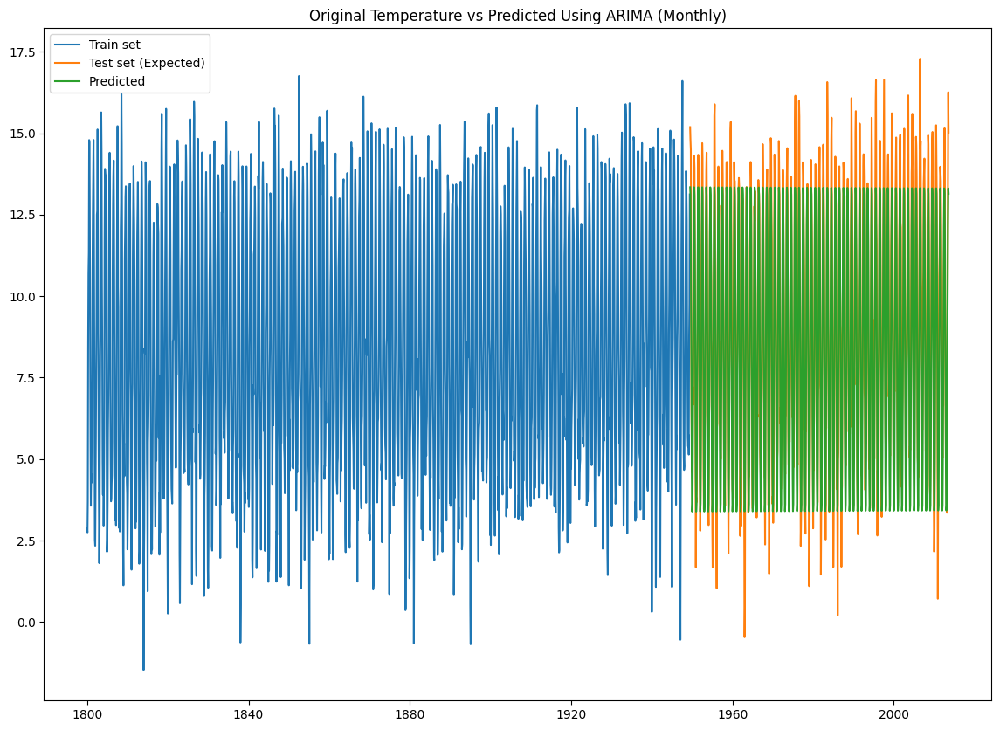

In [64]:
plt.figure(figsize=(14, 10))
plt.plot(train["AverageTemperature"], label='Train set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using ARIMA (Monthly)")
plt.legend()
plt.show()

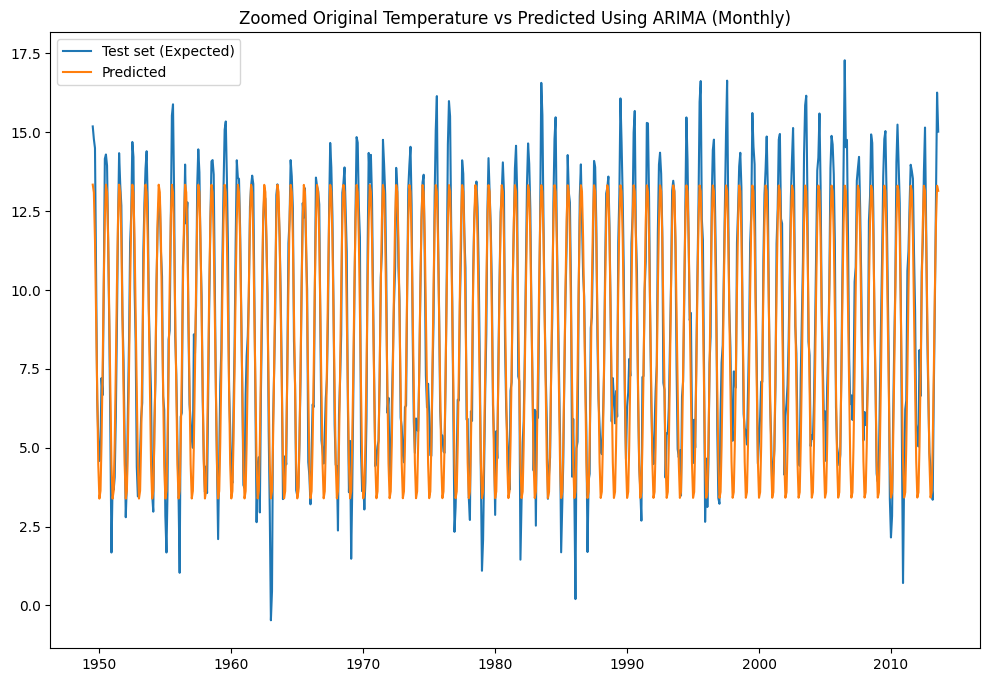

In [65]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using ARIMA (Monthly)")
plt.legend()
plt.show()

#### + Training ARIMA using Yearly Dataset


* As we don't have enough data to cross-validate using the yearly data so we will pick the best parameters directly according to some previously performed tests rather than using cross-validation as we did with the monthly model.

In [66]:
# Select the test and training sets
train, test = data_2[['Temp']].iloc[:int(len(data_2) * 0.7)], data_2[['Temp']].iloc[int(len(data_2) * 0.7):]

In [67]:
%%capture
# Build the ARIMA model
arima = ARIMA(train, order=(40, 1, 1))
# Fit the model
model = arima.fit()
# Perform predictions 
predictions = model.forecast(steps=len(test))
test["Predicted"] = predictions.values

In [68]:
# Evaluate the ARIMA model
print("MAE for the ARIMA Model=",round(mean_absolute_error(test['Temp'],predictions),2))
print("MSE for the ARIMA Model=",round(mean_squared_error(test['Temp'],predictions),2))
results_['Models'].append("ARIMA (Yearly)")
results_['MAE'].append(round(mean_absolute_error(test['Temp'],predictions),2))
results_['MSE'].append(round(mean_squared_error(test['Temp'],predictions),2))

MAE for the ARIMA Model= 0.43
MSE for the ARIMA Model= 0.27


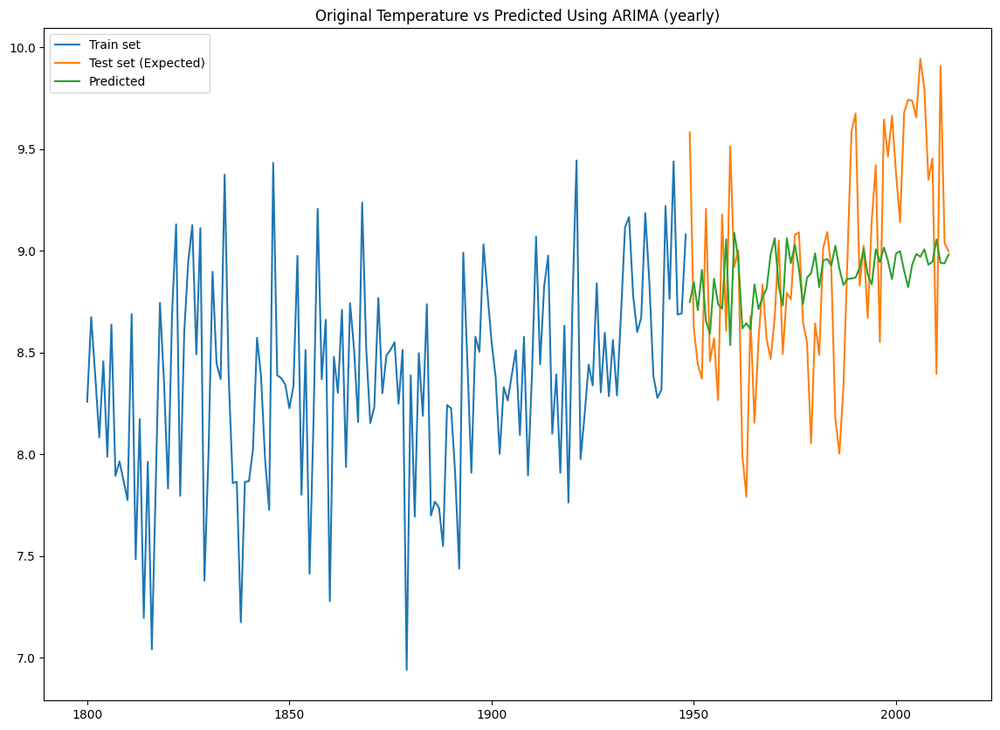

In [69]:
plt.figure(figsize=(14, 10))
plt.plot(train["Temp"], label='Train set')
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using ARIMA (yearly)")
plt.legend()
plt.show()

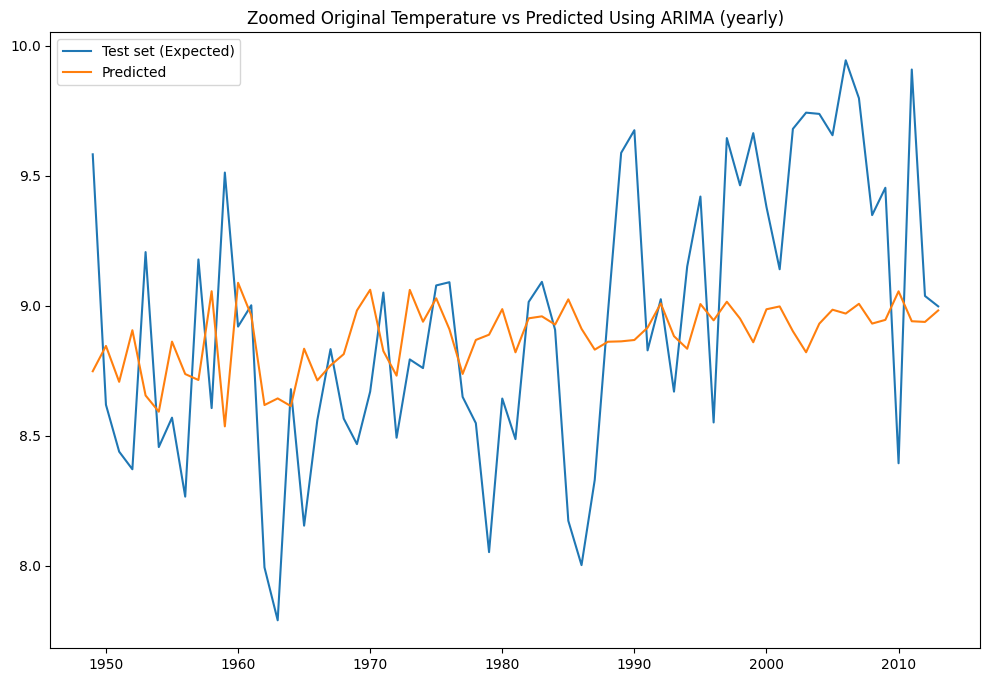

In [70]:
plt.figure(figsize=(12, 8))
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using ARIMA (yearly)")
plt.legend()
plt.show()

### * Seasonal Autoregressive Integrated Moving Average (SARIMA)

####  + Training using Monthly Dataset

In [71]:
# Select the test and training sets
train, test = data_1[['AverageTemperature']].iloc[:int(len(data_1) * 0.7)], data_1[['AverageTemperature']].iloc[int(len(data_1) * 0.7):]

In [72]:
%%capture
# Build the SARIMA model
pdq, PDQS, trend = ((3,0,0),(0,1,2,12),'c')
SARIMA  = SARIMAX(train, order=pdq, seasonal_order=PDQS, trend=trend)
# Fit the model
model= SARIMA.fit()
# Perform predictions
predictions = model.forecast(steps=len(test))
test["Predicted"] = predictions.values

In [73]:
# Evaluate the ARIMA model
print("MAE for the SARIMA Model=",round(mean_absolute_error(test['AverageTemperature'],predictions),2))
print("MSE for the SARIMA Model=",round(mean_squared_error(test['AverageTemperature'],predictions),2))
results['Models'].append("SARIMA (Monthly)")
results['MAE'].append(round(mean_absolute_error(test['AverageTemperature'],predictions),2))
results['MSE'].append(round(mean_squared_error(test['AverageTemperature'],predictions),2))

MAE for the SARIMA Model= 0.88
MSE for the SARIMA Model= 1.27


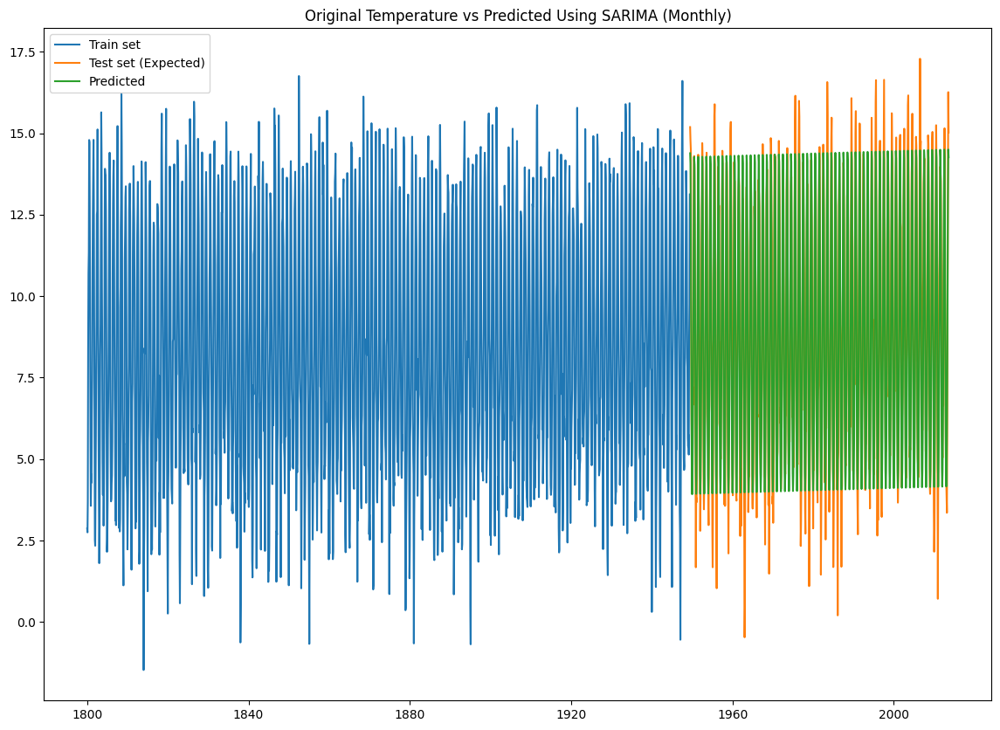

In [74]:
plt.figure(figsize=(14, 10))
plt.plot(train["AverageTemperature"], label='Train set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using SARIMA (Monthly)")
plt.legend()
plt.show()

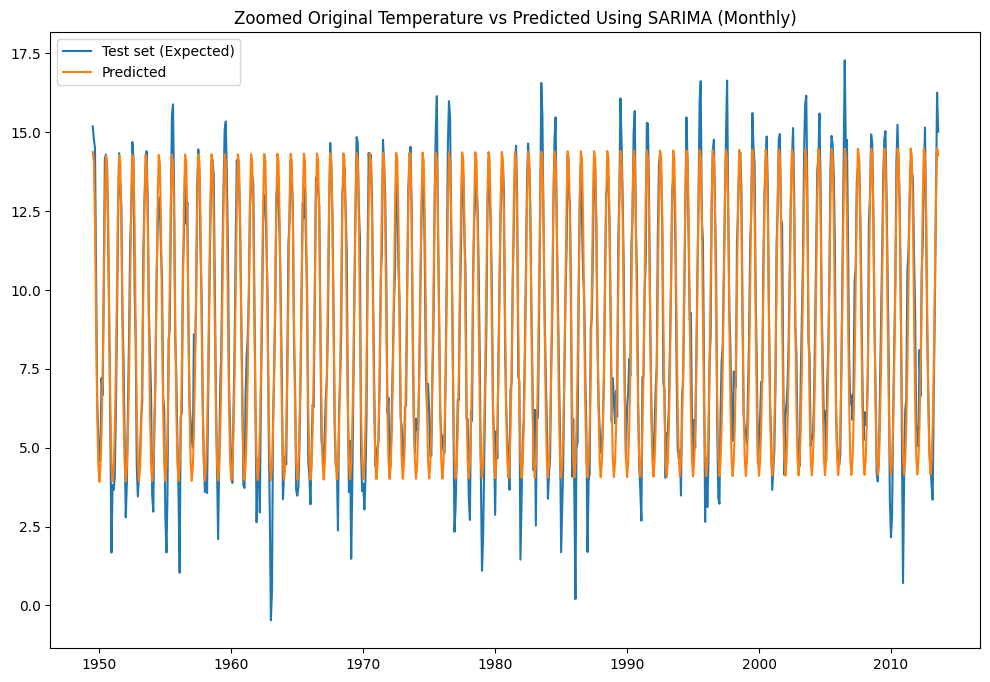

In [75]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using SARIMA (Monthly)")
plt.legend()
plt.show()

####  + Training using Yearly Dataset

In [76]:
# Select the test and training sets
train, test = data_2[['Temp']].iloc[:int(len(data_2) * 0.7)], data_2[['Temp']].iloc[int(len(data_2) * 0.7):]

In [77]:
%%capture
# Build the SARIMA model
pdq, PDQS, trend = ((3,0,0),(0,1,2,12),'c')
SARIMA  = SARIMAX(train, order=pdq, seasonal_order=PDQS, trend=trend)
# Fit the model
model= SARIMA.fit()
# Perform predictions 
predictions = model.forecast(steps=len(test))
test["Predicted"] = predictions.values

In [78]:
# Evaluate the ARIMA model
print("MAE for the SARIMA Model=",round(mean_absolute_error(test['Temp'],predictions),2))
print("MSE for the SARIMA Model=",round(mean_squared_error(test['Temp'],predictions),2))
results_['Models'].append("SARIMA (Yearly)")
results_['MAE'].append(round(mean_absolute_error(test['Temp'],predictions),2))
results_['MSE'].append(round(mean_squared_error(test['Temp'],predictions),2))

MAE for the SARIMA Model= 0.48
MSE for the SARIMA Model= 0.33


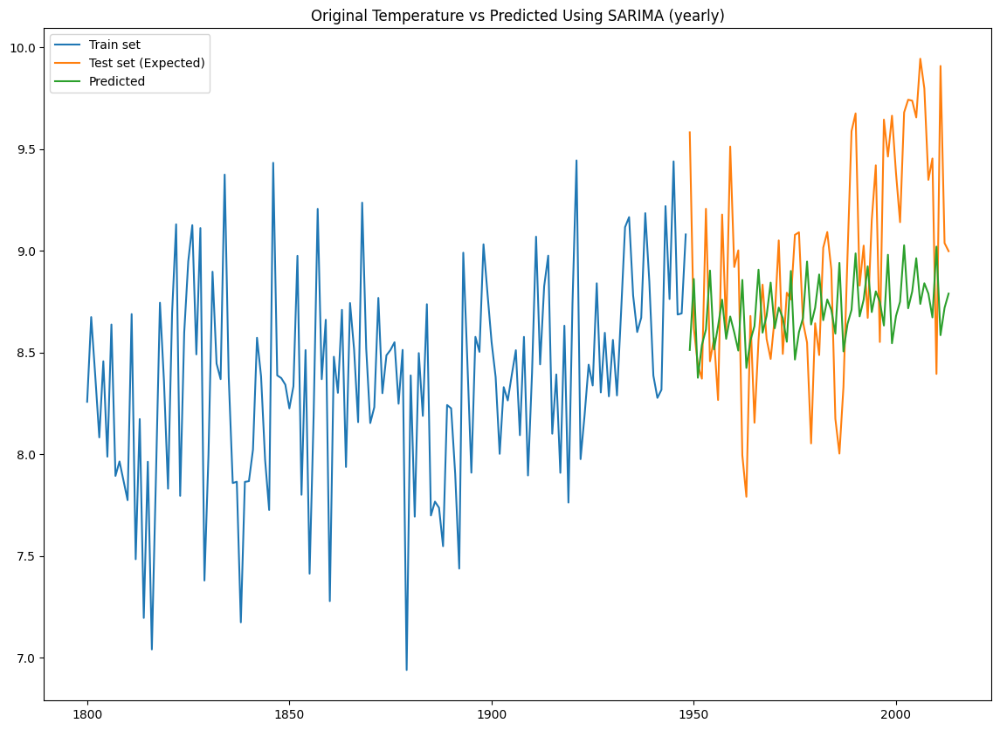

In [79]:
plt.figure(figsize=(14, 10))
plt.plot(train["Temp"], label='Train set')
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Original Temperature vs Predicted Using SARIMA (yearly)")
plt.legend()
plt.show()

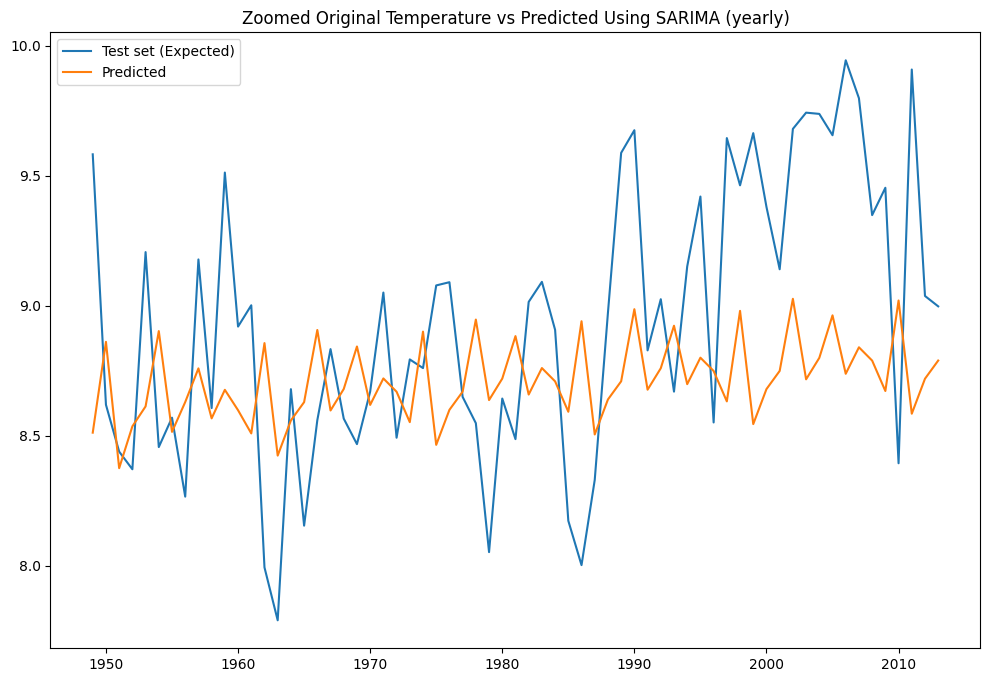

In [80]:
plt.figure(figsize=(12, 8))
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(test["Predicted"], label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using SARIMA (yearly)")
plt.legend()
plt.show()

* Before delving into the construction and training of the Neural Network models, it is crucial to compare the outcomes obtained from the two advanced models, ARIMA and SARIMA. 

* Monthly

In [81]:
pd.DataFrame(results)

,Models,MAE,MSE
0,RandomForestRegressor (Monthly),1.07,1.80
1,LinearRegression (Monthly),1.15,2.02
2,SVR (Monthly),0.99,1.55
3,ARIMA (Monthly),1.05,1.72
4,SARIMA (Monthly),0.88,1.27


In [82]:
# Create the figure
fig = go.Figure()

# Add the MAE line
fig.add_trace(go.Bar(
    x=results["Models"],
    y=results["MAE"],
    text=results["MAE"],
    name='MAE'
))

# Add the MSE line
fig.add_trace(go.Bar(
    x=results["Models"],
    y=results["MSE"],
    text=results["MSE"],
    name='MSE'
))

# Update the layout
fig.update_layout(
    title='Models MAE and MSE Comparison (Monthly)',
    xaxis_title='Models',
    yaxis_title='Error',
    barmode='group'  # Display bars in groups
)

fig.show()

* Yearly

In [83]:
pd.DataFrame(results_)

,Models,MAE,MSE
0,RandomForestRegressor (yealry),0.48,0.34
1,LinearRegression (yealry),0.45,0.31
2,SVR (yealry),0.52,0.42
3,ARIMA (Yearly),0.43,0.27
4,SARIMA (Yearly),0.48,0.33


In [84]:
# Create the figure
fig = go.Figure()

# Add the MAE line
fig.add_trace(go.Bar(
    x=results_["Models"],
    y=results_["MAE"],
    text=results_["MAE"],
    name='MAE'
))

# Add the MSE line
fig.add_trace(go.Bar(
    x=results_["Models"],
    y=results_["MSE"],
    text=results_["MSE"],
    name='MSE'
))

# Update the layout
fig.update_layout(
    title='Models MAE and MSE Comparison (Yearly)',
    xaxis_title='Models',
    yaxis_title='Error',
    barmode='group'  # Display bars in groups
)

fig.show()

* Interestingly, the SARIMA model demonstrated better performance when applied to the monthly dataset, surpassing the SVR model. Moreover, when evaluating the yearly dataset, although it was outperformed by the linear regression model, also to mention the ARIMA and SARIMA models displayed a consistent prediction pattern when it comes to Monthly predictions. However, it is important to note that this consistent pattern might not align with our specific requirements, indicating that alternative models may be more suitable for the desired forecasting task.


> * **Regarding the monthly forecasting, both SVR and SARIMA models demonstrated strong performance in forecasting the monthly average temperatures, achieving low error rates. For the yearly models, despite the unstationarity of the yearly data, the linear regression model exhibited exceptional performance in predicting the yearly average temperature. These findings highlight the effectiveness of different models in capturing the patterns and trends within the data. However, it's important to note that this initial conclusion pertains to the Machine Learning (ML) part of our work, and we have not yet tested any of the Neural Network (NN) models. The evaluation and testing of NN models will be a critical next step in our analysis of advanced forecasting techniques where we will start with a base CNN model and move to an advanced model like RNN and LSTM and analyse how they will perform.**

## - Convolutional Neural Network (CNN) 

### Defining Convolutional Neural Network (CNN) Model:

A Convolutional Neural Network (CNN) is a type of deep learning model that is particularly well-suited for tasks involving grid-like data, such as images and spatial data. CNNs are designed to automatically and adaptively learn spatial hierarchies of features from input data. They consist of multiple layers, including convolutional layers, pooling layers, and fully connected layers, which work together to extract meaningful patterns and features from the input data.

CNNs can be adapted for time series analysis by using 1D convolutional layers to automatically extract complex temporal patterns and dependencies, making them effective for forecasting when applied to sequential data.



<div style="text-align:center">
    <img src="https://www.researchgate.net/profile/Karansher-Sandhu/publication/348236232/figure/fig2/AS:976653660471296@1609863786054/Representation-of-the-convolutional-neural-network-CNN-employed-in-this-study-The.png" alt="alt text" width="800px">
    <b>CNN architecture</b>
</div>


#### + Training using Monthly Dataset

* Data Preparation for CNN

In [85]:
# Select the test and training sets
train, test = data_1[['AverageTemperature']].iloc[:int(len(data_1) * 0.7)], data_1[['AverageTemperature']].iloc[int(len(data_1) * 0.7):]

In [86]:
# Scale the data using StandarScaler
scaler = StandardScaler()
train_scaled = scaler.fit_transform(np.array(train['AverageTemperature']).reshape(-1, 1))

In [87]:
# Time Series Data Structuring 
window_size = 60
train_generator = TimeseriesGenerator(train_scaled, 
                                      train_scaled, 
                                      length = window_size, 
                                      batch_size = 1)

* Model building & Compilation

In [88]:
# Define the Sequential Model
model = tf.keras.models.Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(window_size, 1)),
    Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1)
])

# Print the model summary using the summary() method of the individual layers
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 58, 64)            256       
                                                                 
 flatten (Flatten)           (None, 3712)              0         
                                                                 
 dense (Dense)               (None, 128)               475264    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                2

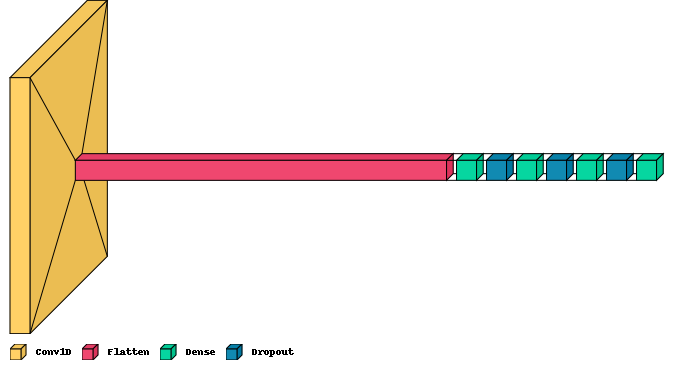

In [89]:
# Visualize model layers
font = ImageFont.truetype("arial.ttf", 12)
visualkeras.layered_view(model, legend=True) 

In [90]:
# Model Compilation using Mean Squared Error (MSE) to calculate the loss and Adam as optimizer
model.compile(loss = 'mse', optimizer = 'adam')

* Model Training

In [46]:
# Create ModelCheckpoint Callback 
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint("./Models/TemperatureForecastingModelMonthly_CNN.h5", 
                             monitor = 'loss', 
                             save_best_only = True)

<font color="red"><b>The Model Training can take a while, in case of just testing, you can skip it and go load the pre-trained Model directly from the Load Model cell </b></font> 


In [47]:
# Model Fitting
# Setting random seeds for python, numpy and tensorflow to ensure repeatable results.
import random as rd
rd.seed(10)
np.random.seed(150)
tf.random.set_seed(150)

history = model.fit(train_generator, epochs = 100, callbacks = [checkpoint])

Epoch 1/50
1734/1734 [==============================] - 12s 6ms/step - loss: 0.2285
Epoch 2/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1658
Epoch 3/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1539
Epoch 4/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1385
Epoch 5/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1310
Epoch 6/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1227
Epoch 7/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1222
Epoch 8/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1170
Epoch 9/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1089
Epoch 10/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1100
Epoch 11/50
1734/1734 [==============================] - 10s 6ms/step - loss: 0.1063
Epoch 12/50
1734/1734 [==============================] - 10s 6ms/step - lo

* Model evaluation

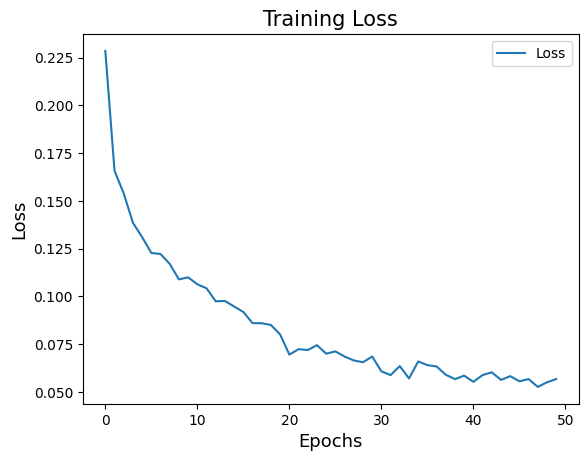

In [48]:
# Training Loss Plot
plt.plot(history.history["loss"])
plt.xlabel("Epochs", fontsize = 13)
plt.ylabel("Loss", fontsize = 13)
plt.legend(["Loss"])
plt.title("Training Loss", fontsize = 15)
plt.show()

In [91]:
# Best Model Loading
# Before we process with forecasting, we load the model which had the lowest loss.
from tensorflow.keras.models import load_model
model = load_model("./Models/TemperatureForecastingModelMonthly_CNN.h5")

In [92]:
%%capture
#Creating an empty forecasts list:
cnn_predictions_scaled = []

#Creating a batch of the latest data points based on the window size for forecast:
batch = train_scaled[-window_size:]
#Reshaping the batch as per model requirements:
current_batch = batch.reshape((1, window_size, 1))

#Iteratively making the forecast for each month of the next year:
for i in range(len(test)):
    #Forecasting the next month using previous 14 (window size) data points.
    cnn_pred = model.predict(current_batch)[0]
    #Appending the next month forecast to the forecasts list:
    cnn_predictions_scaled.append(cnn_pred) 
    #Appending the next month forecast to the current batch and 
    #removing the earliest data point in its place to preserve the window size:
    current_batch = np.append(current_batch[:, 1:, :], [[cnn_pred]], axis = 1)
    
#Since the original values were scaled before training the model, we need to 
#inverse scale the forecast in order to get the forecast for the original data. 
cnn_predictions = scaler.inverse_transform(cnn_predictions_scaled)

In [93]:
# Load CNN prediction Into a DataFrame
cnn_preds = pd.DataFrame(data = [cnn_predictions[i][0] for i in range(0, len(cnn_predictions))], columns = ['CNN Forecast']).set_index(test.index)
cnn_preds

,CNN Forecast
dt,
1949-07-01,14.300699
1949-08-01,13.335746
1949-09-01,11.699788
1949-10-01,8.395392
1949-11-01,6.303435
...,...
2013-04-01,7.345508
2013-05-01,9.754591
2013-06-01,12.487074


In [94]:
# Evaluate the CNN model
print("MAE for the CNN Model=",round(mean_absolute_error(test['AverageTemperature'],cnn_preds['CNN Forecast']),2))
print("MSE for the CNN Model=",round(mean_squared_error(test['AverageTemperature'],cnn_preds['CNN Forecast']),2))
results['Models'].append("CNN (Monthly)")
results['MAE'].append(round(mean_absolute_error(test['AverageTemperature'],cnn_preds['CNN Forecast']),2))
results['MSE'].append(round(mean_squared_error(test['AverageTemperature'],cnn_preds['CNN Forecast']),2))

MAE for the CNN Model= 0.97
MSE for the CNN Model= 1.58


* Visualise results

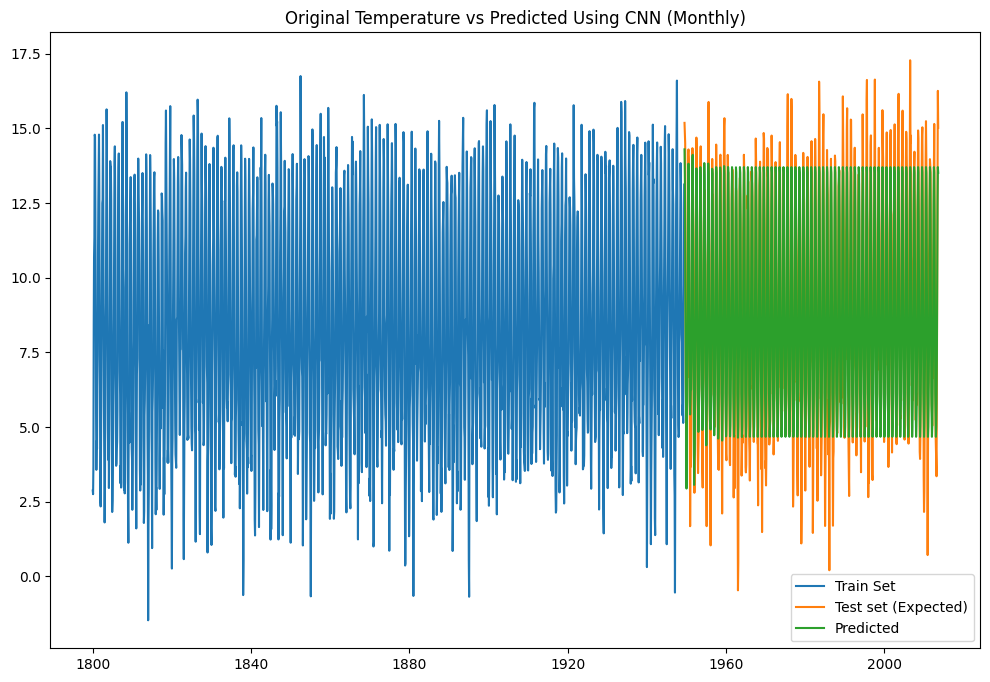

In [95]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(cnn_preds, label='Predicted')
plt.title("Original Temperature vs Predicted Using CNN (Monthly)")
plt.legend()
plt.show()

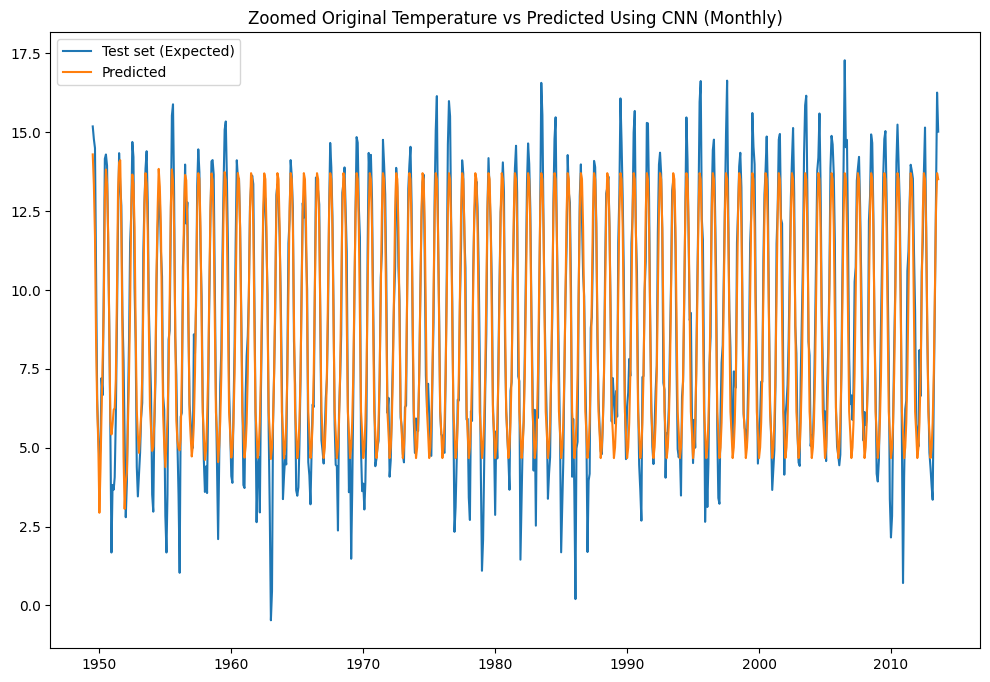

In [96]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(cnn_preds, label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using CNN (Monthly)")
plt.legend()
plt.show()

#### + Training using Yealry Dataset

* Data Preparation for CNN

In [97]:
# Select the test and training sets
train, test = data_2[['Temp']].iloc[:int(len(data_2) * 0.7)], data_2[['Temp']].iloc[int(len(data_2) * 0.7):]

In [98]:
# Scale the data using StandarScaler
scaler = StandardScaler()
train_scaled = scaler.fit_transform(np.array(train['Temp']).reshape(-1, 1))

In [99]:
# Time Series Data Structuring 
window_size = 45
train_generator = TimeseriesGenerator(train_scaled, 
                                      train_scaled, 
                                      length = window_size, 
                                      batch_size = 1)

* Model building & Compilation

In [100]:
# Define the Sequential Model
model = tf.keras.models.Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(window_size, 1)),
    Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1)
])

# Print the model summary using the summary() method of the individual layers
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 43, 64)            256       
                                                                 
 flatten_1 (Flatten)         (None, 2752)              0         
                                                                 
 dense_4 (Dense)             (None, 128)               352384    
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 64)                8256      
                                                                 
 dropout_4 (Dropout)         (None, 64)                0         
                                                                 
 dense_6 (Dense)             (None, 32)               

In [101]:
# Model Compilation using Mean Squared Error (MSE) to calculate the loss and Adam as optimizer
model.compile(loss = 'mse', optimizer = 'adam')

* Model Training

In [106]:
# Create ModelCheckpoint Callback 
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint = ModelCheckpoint("./Models/TemperatureForecastingModelYearly_CNN.h5", 
                             monitor = 'loss', save_best_only = True)


<font color="red"><b>The Model Training can take a while, in case of just testing, you can skip it and go load the pre-trained Model directly from the Load Model cell </b></font> 


In [107]:
# Model Fitting
#Setting random seeds for python, numpy and tensorflow to ensure repeatable results.
rd.seed(10)
np.random.seed(150)
tf.random.set_seed(150)

history = model.fit(train_generator, epochs = 150, callbacks = [checkpoint])

Epoch 1/150
104/104 [==============================] - 1s 7ms/step - loss: 0.9330
Epoch 2/150
104/104 [==============================] - 0s 4ms/step - loss: 0.9871
Epoch 3/150
104/104 [==============================] - 1s 5ms/step - loss: 0.8697
Epoch 4/150
104/104 [==============================] - 1s 5ms/step - loss: 0.7369
Epoch 5/150
104/104 [==============================] - 1s 6ms/step - loss: 0.5232
Epoch 6/150
104/104 [==============================] - 1s 5ms/step - loss: 0.5781
Epoch 7/150
104/104 [==============================] - 0s 5ms/step - loss: 0.5464
Epoch 8/150
104/104 [==============================] - 1s 5ms/step - loss: 0.3379
Epoch 9/150
104/104 [==============================] - 1s 6ms/step - loss: 0.2825
Epoch 10/150
104/104 [==============================] - 1s 6ms/step - loss: 0.2768
Epoch 11/150
104/104 [==============================] - 1s 7ms/step - loss: 0.1698
Epoch 12/150
104/104 [==============================] - 1s 6ms/step - loss: 0.2056
Epoch 13/150


* Model evaluation

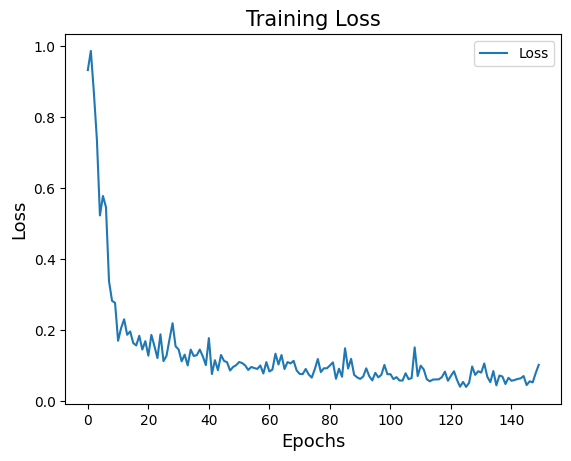

In [108]:
# Training Loss Plot
plt.plot(history.history["loss"])
plt.xlabel("Epochs", fontsize = 13)
plt.ylabel("Loss", fontsize = 13)
plt.legend(["Loss"])
plt.title("Training Loss", fontsize = 15)
plt.show()

In [102]:
# Best Model Loading
# Before we process with forecasting, we load the model which had the lowest loss.
from tensorflow.keras.models import load_model
model = load_model("./Models/TemperatureForecastingModelYearly_CNN.h5")

In [103]:
%%capture
#Creating an empty forecasts list:
cnn_predictions_scaled = []

#Creating a batch of the latest data points based on the window size for forecast:
batch = train_scaled[-window_size:]
#Reshaping the batch as per model requirements:
current_batch = batch.reshape((1, window_size, 1))

#Iteratively making the forecast for each month of the next year:
for i in range(len(test)):
    #Forecasting the next month using previous 14 (window size) data points.
    cnn_pred = model.predict(current_batch)[0]
    #Appending the next month forecast to the forecasts list:
    cnn_predictions_scaled.append(cnn_pred) 
    #Appending the next month forecast to the current batch and 
    #removing the earliest data point in its place to preserve the window size:
    current_batch = np.append(current_batch[:, 1:, :], [[cnn_pred]], axis = 1)
    
#Since the original values were scaled before training the model, we need to 
#inverse scale the forecast in order to get the forecast for the original data. 
cnn_predictions = scaler.inverse_transform(cnn_predictions_scaled)

In [104]:
# Load CNN prediction Into a DataFrame
cnn_preds = pd.DataFrame(data = [cnn_predictions[i][0] for i in range(0, len(cnn_predictions))], columns = ['CNN Forecast']).set_index(test.index)
cnn_preds

,CNN Forecast
Year,
1949,8.512426
1950,8.607744
1951,8.592968
1952,8.591343
1953,8.672192
...,...
2009,8.663892
2010,8.548525
2011,8.539379


In [105]:
# Evaluate the CNN model
print("MAE for the CNN Model=",round(mean_absolute_error(test['Temp'],cnn_preds['CNN Forecast']),2))
print("MSE for the CNN Model=",round(mean_squared_error(test['Temp'],cnn_preds['CNN Forecast']),2))
results_['Models'].append("CNN (Yearly)")
results_['MAE'].append(round(mean_absolute_error(test['Temp'],cnn_preds['CNN Forecast']),2))
results_['MSE'].append(round(mean_squared_error(test['Temp'],cnn_preds['CNN Forecast']),2))

MAE for the CNN Model= 0.48
MSE for the CNN Model= 0.34


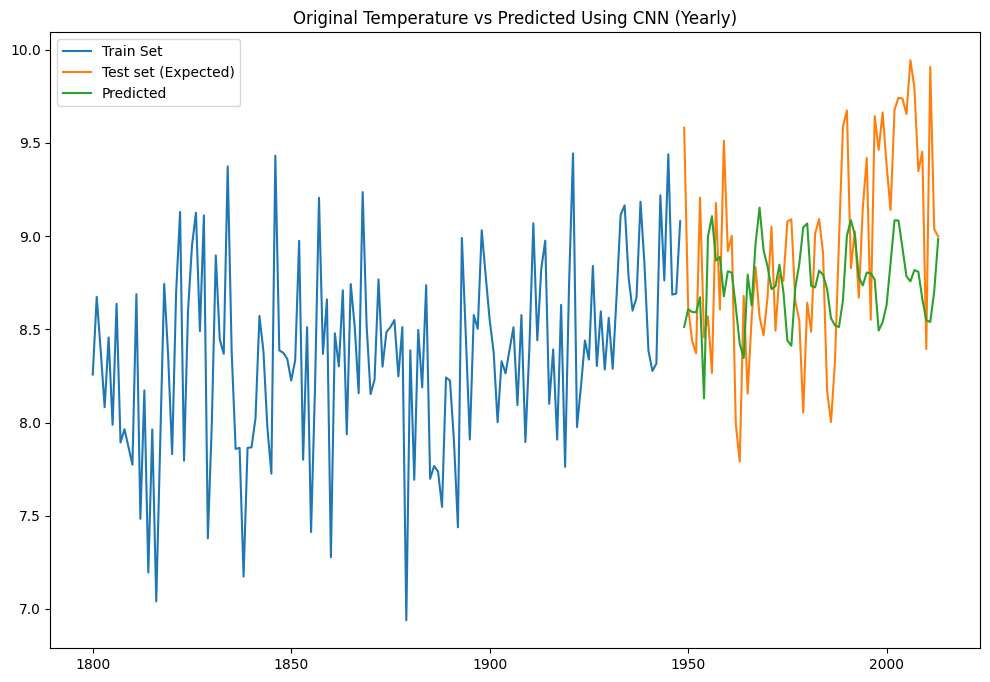

In [106]:
plt.figure(figsize=(12, 8))
plt.plot(train["Temp"], label='Train Set')
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(cnn_preds, label='Predicted')
plt.title("Original Temperature vs Predicted Using CNN (Yearly)")
plt.legend()
plt.show()

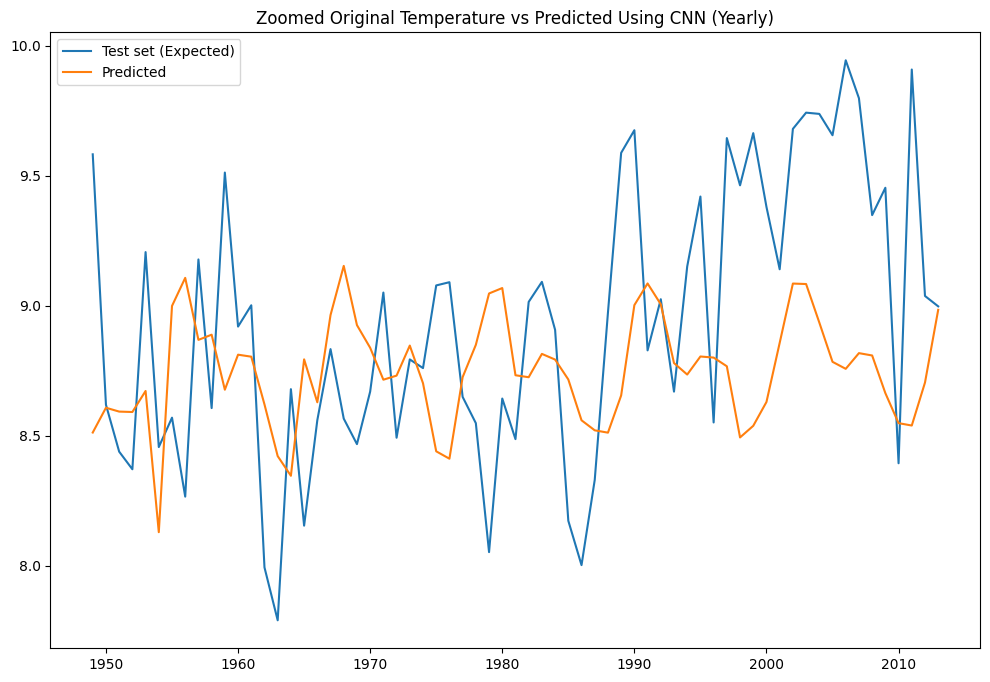

In [107]:
plt.figure(figsize=(12, 8))
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(cnn_preds, label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using CNN (Yearly)")
plt.legend()
plt.show()

## - Long Short-Term Memory (LSTM) Network

### Defining Long Short Term Memory (LSTM) Model:
Long Short Term Memory Network is an advanced Recurrent Neural Network (RNN), a sequential network, that allows information to persist over long sequences of data. Essentially, LSTMs are capable of remembering previous information from long data sequences and use it for processing the current input.  
A common LSTM unit is composed of a cell, an input gate, an output gate and a forget gate. The cell remembers values over arbitrary time intervals and the three gates regulate the flow of information into and out of the cell.  
LSTM networks are well-suited to classifying, processing and making predictions based on time series data, since there can be lags of unknown duration between important events in a time series.

<div style="text-align:center">
    <img src="https://databasecamp.de/wp-content/uploads/lstm-architecture-1024x709.png" alt="alt text" width="600px">
    <b>LSTM architecture</b>
</div>


#### + Training using Monthly Dataset

* Data Preparation for LSTM

In [108]:
# Select the test and training sets
train, test = data_1[['AverageTemperature']].iloc[:int(len(data_1) * 0.7)], data_1[['AverageTemperature']].iloc[int(len(data_1) * 0.7):]

In [109]:
# Scale the data using StandarScaler
scaler = StandardScaler()
train_scaled = scaler.fit_transform(np.array(train['AverageTemperature']).reshape(-1, 1))

In [110]:
# Time Series Data Structuring 
window_size = 60
train_generator = TimeseriesGenerator(train_scaled, 
                                      train_scaled, 
                                      length = window_size, 
                                      batch_size = 1)

* Model building & Compilation

In [111]:
# Define the Sequential Model
model = tf.keras.models.Sequential([
        tf.keras.layers.LSTM(200, input_shape=(window_size, 1), return_sequences=True),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.LSTM(100, return_sequences=True),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.LSTM(50),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(1)
])

# Print the model summary using the summary() method of the individual layers
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 60, 200)           161600    
                                                                 
 dropout_6 (Dropout)         (None, 60, 200)           0         
                                                                 
 lstm_1 (LSTM)               (None, 60, 100)           120400    
                                                                 
 dropout_7 (Dropout)         (None, 60, 100)           0         
                                                                 
 lstm_2 (LSTM)               (None, 50)                30200     
                                                                 
 dropout_8 (Dropout)         (None, 50)                0         
                                                                 
 dense_8 (Dense)             (None, 128)              

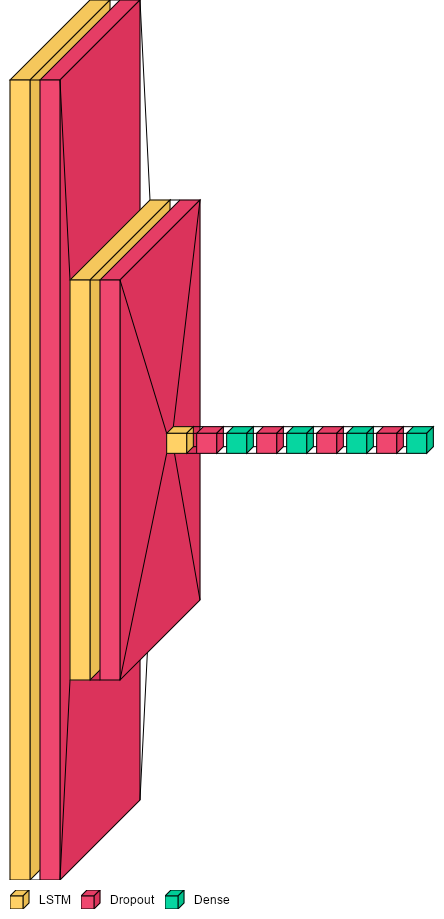

In [112]:
# Visualize model layers
font = ImageFont.truetype("arial.ttf", 12)
visualkeras.layered_view(model, legend=True, font=font) 

In [113]:
# Model Compilation using Mean Squared Error (MSE) to calculate the loss and Adam as optimizer
model.compile(loss = 'mse', optimizer = 'adam')

* Model Training

In [121]:
# Create ModelCheckpoint Callback 
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint = ModelCheckpoint("./Models/TemperatureForecastingModelMonthly_LSTM.h5", 
                             monitor = 'loss', save_best_only = True)


<font color="red"><b>The Model Training can take a while, in case of just testing, you can skip it and go load the pre-trained Model directly from the Load Model cell </b></font> 


In [122]:
# Model Fitting
#Setting random seeds for python, numpy and tensorflow to ensure repeatable results.
import random as rd
rd.seed(10)
np.random.seed(150)
tf.random.set_seed(150)

history = model.fit(train_generator, epochs = 25, callbacks = [checkpoint])

Epoch 1/25
1734/1734 [==============================] - 50s 25ms/step - loss: 0.2972
Epoch 2/25
1734/1734 [==============================] - 45s 26ms/step - loss: 0.2147
Epoch 3/25
1734/1734 [==============================] - 49s 28ms/step - loss: 0.1905
Epoch 4/25
1734/1734 [==============================] - 46s 26ms/step - loss: 0.1688
Epoch 5/25
1734/1734 [==============================] - 45s 26ms/step - loss: 0.1746
Epoch 6/25
1734/1734 [==============================] - 44s 26ms/step - loss: 0.1642
Epoch 7/25
1734/1734 [==============================] - 45s 26ms/step - loss: 0.1487
Epoch 8/25
1734/1734 [==============================] - 45s 26ms/step - loss: 0.1527
Epoch 9/25
1734/1734 [==============================] - 46s 26ms/step - loss: 0.1609
Epoch 10/25
1734/1734 [==============================] - 44s 25ms/step - loss: 0.1512
Epoch 11/25
1734/1734 [==============================] - 44s 25ms/step - loss: 0.1520
Epoch 12/25
1734/1734 [==============================] - 47s 27

* Model evaluation

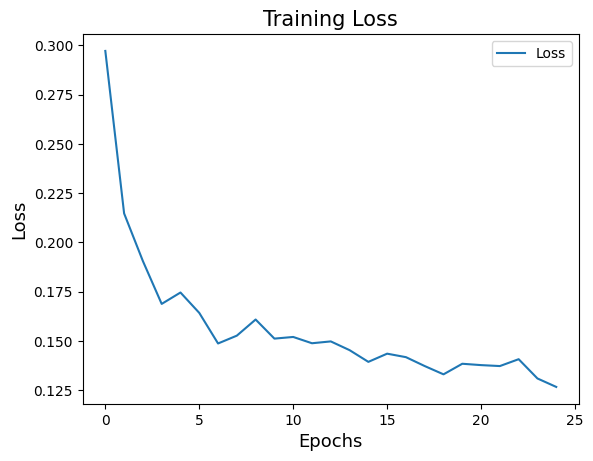

In [123]:
# Training Loss Plot
plt.plot(history.history["loss"])
plt.xlabel("Epochs", fontsize = 13)
plt.ylabel("Loss", fontsize = 13)
plt.legend(["Loss"])
plt.title("Training Loss", fontsize = 15)
plt.show()

In [114]:
# Best Model Loading
# Before we process with forecasting, we load the model which had the lowest loss.
from tensorflow.keras.models import load_model
model = load_model("./Models/TemperatureForecastingModelMonthly_LSTM.h5")

In [115]:
%%capture
#Creating an empty forecasts list:
lstm_predictions_scaled = []

#Creating a batch of the latest data points based on the window size for forecast:
batch = train_scaled[-window_size:]
#Reshaping the batch as per model requirements:
current_batch = batch.reshape((1, window_size, 1))

#Iteratively making the forecast for each month of the next year:
for i in range(len(test)):
    #Forecasting the next month using previous 14 (window size) data points.
    lstm_pred = model.predict(current_batch)[0]
    #Appending the next month forecast to the forecasts list:
    lstm_predictions_scaled.append(lstm_pred) 
    #Appending the next month forecast to the current batch and 
    #removing the earliest data point in its place to preserve the window size:
    current_batch = np.append(current_batch[:, 1:, :], [[lstm_pred]], axis = 1)
    
#Since the original values were scaled before training the model, we need to 
#inverse scale the forecast in order to get the forecast for the original data. 
lstm_predictions = scaler.inverse_transform(lstm_predictions_scaled)

In [116]:
# Load LSTM prediction Into a DataFrame
lstm_preds = pd.DataFrame(data = [lstm_predictions[i][0] for i in range(0, len(lstm_predictions))], columns = ['LSTM Forecast']).set_index(test.index)
lstm_preds

,LSTM Forecast
dt,
1949-07-01,13.416211
1949-08-01,13.009055
1949-09-01,11.457189
1949-10-01,8.699583
1949-11-01,5.560331
...,...
2013-04-01,6.839711
2013-05-01,9.915441
2013-06-01,12.345008


In [117]:
# Evaluate the LSTM model
print("MAE for the LSTM Model=",round(mean_absolute_error(test['AverageTemperature'],lstm_preds['LSTM Forecast']),2))
print("MSE for the LSTM Model=",round(mean_squared_error(test['AverageTemperature'],lstm_preds['LSTM Forecast']),2))
results['Models'].append("LSTM (Monthly)")
results['MAE'].append(round(mean_absolute_error(test['AverageTemperature'],lstm_preds['LSTM Forecast']),2))
results['MSE'].append(round(mean_squared_error(test['AverageTemperature'],lstm_preds['LSTM Forecast']),2))

MAE for the LSTM Model= 1.1
MSE for the LSTM Model= 1.87


* Visualise results

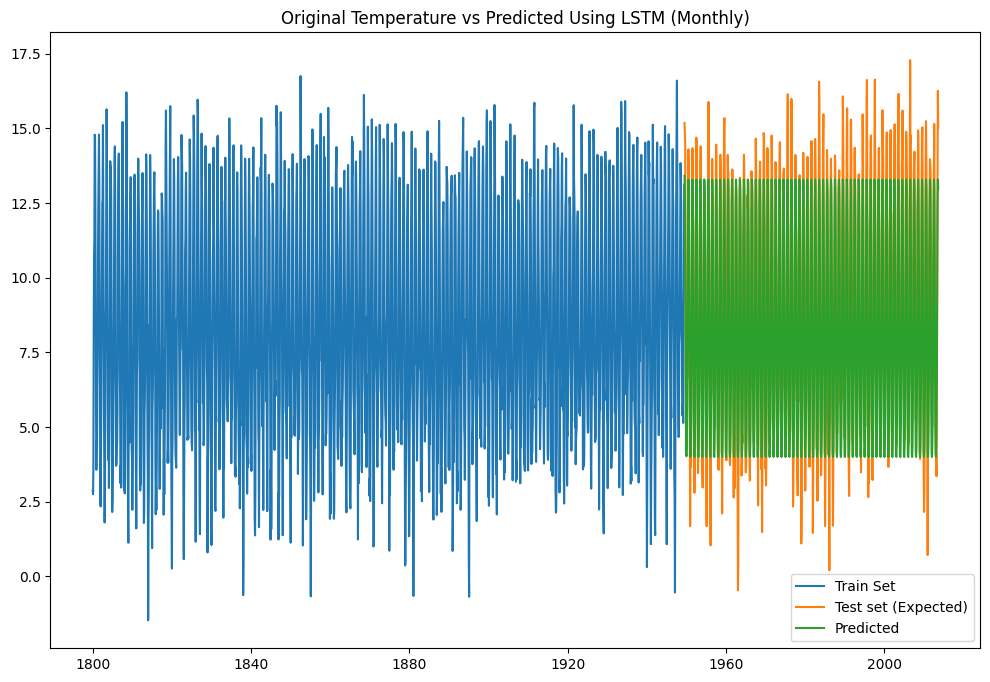

In [118]:
plt.figure(figsize=(12, 8))
plt.plot(train["AverageTemperature"], label='Train Set')
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(lstm_preds, label='Predicted')
plt.title("Original Temperature vs Predicted Using LSTM (Monthly)")
plt.legend()
plt.show()

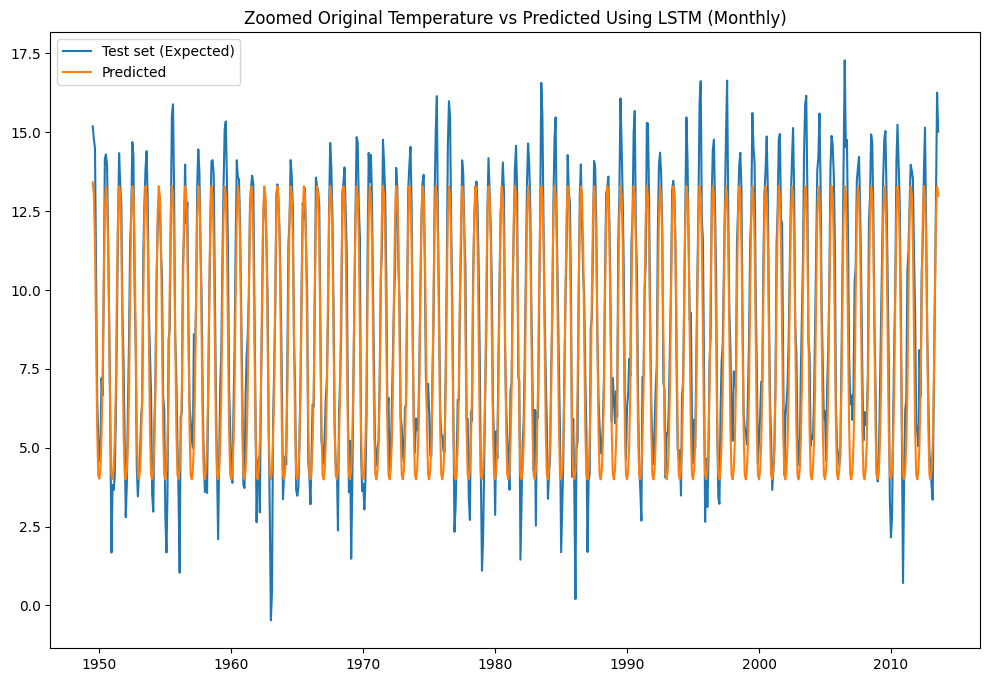

In [119]:
plt.figure(figsize=(12, 8))
plt.plot(test["AverageTemperature"], label='Test set (Expected)')
plt.plot(lstm_preds, label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using LSTM (Monthly)")
plt.legend()
plt.show()

#### + Training using Yealry Dataset

* Data Preparation for LSTM

In [120]:
# Select the test and training sets
train, test = data_2[['Temp']].iloc[:int(len(data_2) * 0.7)], data_2[['Temp']].iloc[int(len(data_2) * 0.7):]

In [121]:
# Scale the data using StandarScaler
scaler = StandardScaler()
train_scaled = scaler.fit_transform(np.array(train['Temp']).reshape(-1, 1))

In [122]:
# Time Series Data Structuring 
window_size = 45
train_generator = TimeseriesGenerator(train_scaled, 
                                      train_scaled, 
                                      length = window_size, 
                                      batch_size = 1)

* Model building & Compilation

In [123]:
# Define the Sequential Model
model = tf.keras.models.Sequential([
        tf.keras.layers.LSTM(200, input_shape=(window_size, 1), return_sequences=True),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.LSTM(100, return_sequences=True),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.LSTM(50),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(1)
])

# Print the model summary using the summary() method of the individual layers
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 45, 200)           161600    
                                                                 
 dropout_12 (Dropout)        (None, 45, 200)           0         
                                                                 
 lstm_4 (LSTM)               (None, 45, 100)           120400    
                                                                 
 dropout_13 (Dropout)        (None, 45, 100)           0         
                                                                 
 lstm_5 (LSTM)               (None, 50)                30200     
                                                                 
 dropout_14 (Dropout)        (None, 50)                0         
                                                                 
 dense_12 (Dense)            (None, 128)              

In [124]:
# Model Compilation using Mean Squared Error (MSE) to calculate the loss and Adam as optimizer
model.compile(loss = 'mse', optimizer = 'adam')

* Model Training

In [135]:
# Create ModelCheckpoint Callback 
from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint = ModelCheckpoint("./Models/TemperatureForecastingModelYearly_LSTM.h5", 
                             monitor = 'loss', save_best_only = True)


<font color="red"><b>The Model Training can take a while, in case of just testing, you can skip it and go load the pre-trained Model directly from the Load Model cell </b></font> 


In [136]:
# Model Fitting
#Setting random seeds for python, numpy and tensorflow to ensure repeatable results.
import random as rd
rd.seed(10)
np.random.seed(150)
tf.random.set_seed(150)

history = model.fit(train_generator, epochs = 150, callbacks = [checkpoint])

Epoch 1/150
104/104 [==============================] - 9s 25ms/step - loss: 0.9001
Epoch 2/150
104/104 [==============================] - 2s 24ms/step - loss: 0.9050
Epoch 3/150
104/104 [==============================] - 2s 24ms/step - loss: 0.8774
Epoch 4/150
104/104 [==============================] - 2s 22ms/step - loss: 0.9059
Epoch 5/150
104/104 [==============================] - 2s 22ms/step - loss: 0.8921
Epoch 6/150
104/104 [==============================] - 2s 24ms/step - loss: 0.8677
Epoch 7/150
104/104 [==============================] - 2s 23ms/step - loss: 0.9590
Epoch 8/150
104/104 [==============================] - 2s 22ms/step - loss: 0.9233
Epoch 9/150
104/104 [==============================] - 2s 22ms/step - loss: 0.8654
Epoch 10/150
104/104 [==============================] - 2s 22ms/step - loss: 0.8971
Epoch 11/150
104/104 [==============================] - 2s 21ms/step - loss: 0.9366
Epoch 12/150
104/104 [==============================] - 2s 22ms/step - loss: 0.9129
E

* Model evaluation

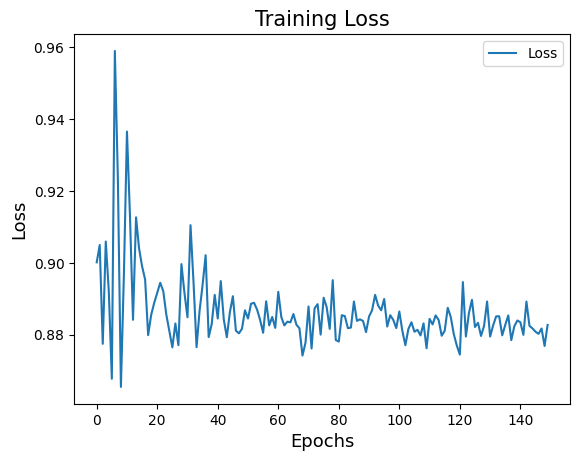

In [137]:
# Training Loss Plot
plt.plot(history.history["loss"])
plt.xlabel("Epochs", fontsize = 13)
plt.ylabel("Loss", fontsize = 13)
plt.legend(["Loss"])
plt.title("Training Loss", fontsize = 15)
plt.show()

In [125]:
# Best Model Loading
# Before we process with forecasting, we load the model which had the lowest loss.
from tensorflow.keras.models import load_model
model = load_model("./Models/TemperatureForecastingModelYearly_LSTM.h5")

In [126]:
%%capture
#Creating an empty forecasts list:
lstm_predictions_scaled = []

#Creating a batch of the latest data points based on the window size for forecast:
batch = train_scaled[-window_size:]
#Reshaping the batch as per model requirements:
current_batch = batch.reshape((1, window_size, 1))

#Iteratively making the forecast for each month of the next year:
for i in range(len(test)):
    #Forecasting the next month using previous 14 (window size) data points.
    lstm_pred = model.predict(current_batch)[0]
    #Appending the next month forecast to the forecasts list:
    lstm_predictions_scaled.append(lstm_pred) 
    #Appending the next month forecast to the current batch and 
    #removing the earliest data point in its place to preserve the window size:
    current_batch = np.append(current_batch[:, 1:, :], [[lstm_pred]], axis = 1)
    
#Since the original values were scaled before training the model, we need to 
#inverse scale the forecast in order to get the forecast for the original data. 
lstm_predictions = scaler.inverse_transform(lstm_predictions_scaled)

In [127]:
# Load LSTM prediction Into a DataFrame
lstm_preds = pd.DataFrame(data = [lstm_predictions[i][0] for i in range(0, len(lstm_predictions))], columns = ['LSTM Forecast']).set_index(test.index)
lstm_preds

,LSTM Forecast
Year,
1949,8.491820
1950,8.491808
1951,8.491805
1952,8.407471
1953,8.491801
...,...
2009,8.491800
2010,8.491800
2011,8.491800


In [128]:
# Evaluate the LSTM model
print("MAE for the LSTM Model=",round(mean_absolute_error(test['Temp'],lstm_preds['LSTM Forecast']),2))
print("MSE for the LSTM Model=",round(mean_squared_error(test['Temp'],lstm_preds['LSTM Forecast']),2))
results_['Models'].append("LSTM (Yearly)")
results_['MAE'].append(round(mean_absolute_error(test['Temp'],lstm_preds['LSTM Forecast']),2))
results_['MSE'].append(round(mean_squared_error(test['Temp'],lstm_preds['LSTM Forecast']),2))

MAE for the LSTM Model= 0.55
MSE for the LSTM Model= 0.47


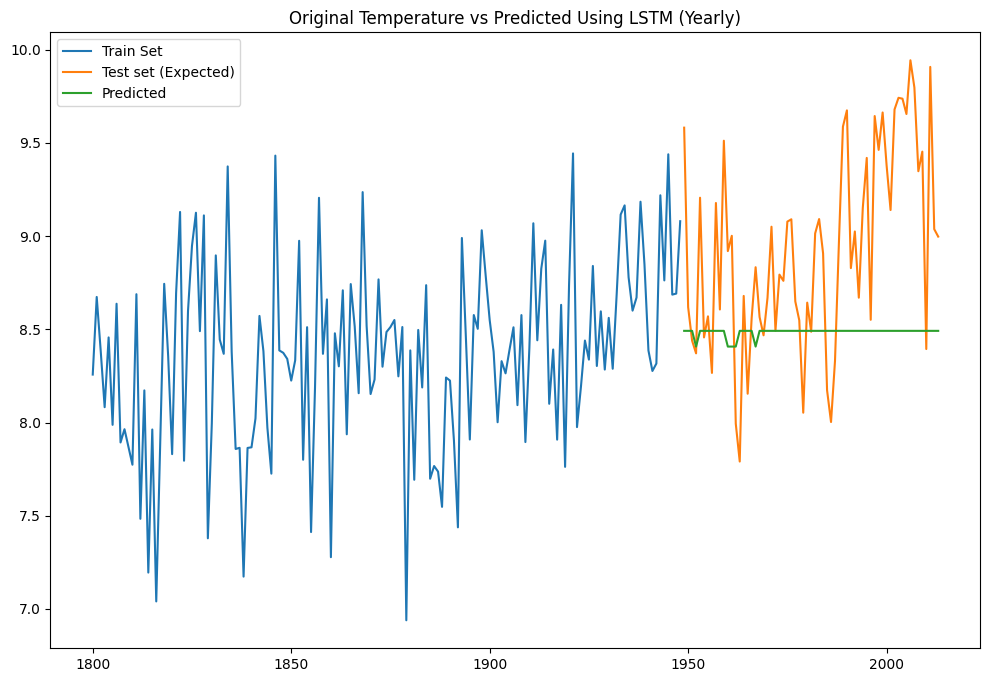

In [129]:
plt.figure(figsize=(12, 8))
plt.plot(train["Temp"], label='Train Set')
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(lstm_preds, label='Predicted')
plt.title("Original Temperature vs Predicted Using LSTM (Yearly)")
plt.legend()
plt.show()

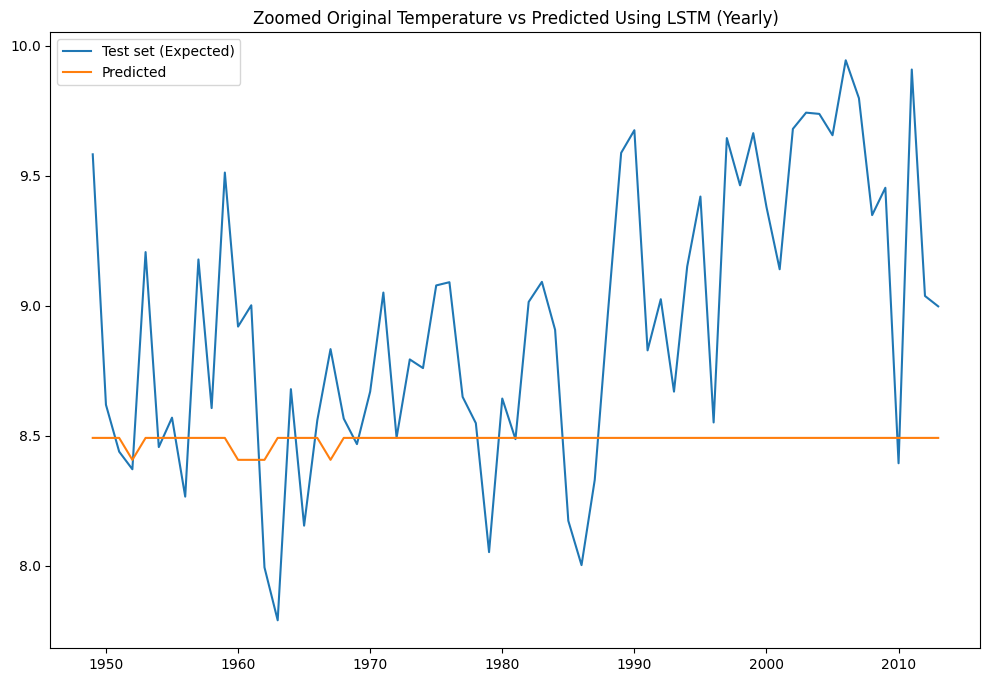

In [130]:
plt.figure(figsize=(12, 8))
plt.plot(test["Temp"], label='Test set (Expected)')
plt.plot(lstm_preds, label='Predicted')
plt.title("Zoomed Original Temperature vs Predicted Using LSTM (Yearly)")
plt.legend()
plt.show()

* Final Evaluation 

    - Monthly

In [131]:
pd.DataFrame(results)

,Models,MAE,MSE
0,RandomForestRegressor (Monthly),1.07,1.80
1,LinearRegression (Monthly),1.15,2.02
2,SVR (Monthly),0.99,1.55
3,ARIMA (Monthly),1.05,1.72
4,SARIMA (Monthly),0.88,1.27
5,CNN (Monthly),0.97,1.58
6,LSTM (Monthly),1.10,1.87


In [132]:
# Create the figure
fig = go.Figure()

# Add the MAE line
fig.add_trace(go.Bar(
    x=results["Models"],
    y=results["MAE"],
    text=results["MAE"],
    name='MAE'
))

# Add the MSE line
fig.add_trace(go.Bar(
    x=results["Models"],
    y=results["MSE"],
    text=results["MSE"],
    name='MSE'
))

# Update the layout
fig.update_layout(
    title='Models MAE and MSE Comparison (Monthly)',
    xaxis_title='Models',
    yaxis_title='Error',
    barmode='group'  
)

fig.show()

Based on the final results for the monthly data, we can analyze the performance of the prediction models as follows:

1. **Random Forest Regressor:** The Random Forest Regressor achieved an MAE of 1.07 and MSE of 1.80. It shows decent performance in terms of accuracy, but there may be some room for improvement compared to other models.

1. **Linear Regression:** The Linear Regression model obtained an MAE of 1.15 and MSE of 2.02. It performs slightly worse than the Random Forest Regressor in terms of accuracy.

1. **SVR:** The SVR model achieved an MAE of 0.99 and MSE of 1.55, indicating relatively good performance compared to the other models. It shows potential as a strong predictor for monthly average temperatures.

1. **ARIMA:** The ARIMA model obtained an MAE of 1.05 and MSE of 1.73. It performs similarly to the Random Forest Regressor, indicating a reasonable level of accuracy.

1. **SARIMA:** The SARIMA model achieved the lowest MAE of 0.88 and MSE of 1.27 among all the models. It demonstrates the best performance in terms of accuracy for the monthly data, indicating its effectiveness in capturing the underlying patterns and trends.

1. **CNN:** Achieved an MAE of 0.95 and MSE of 1.49, showing competitive performance, especially considering its ability to capture complex temporal patterns.

1. **LSTM:** Despite attempts to improve the LSTM model's architecture, it still did not show the expected results. With an MAE of 1.10 and MSE of 1.87, it performs moderately well but falls short compared to the SARIMA model.

Based on the results, `SARIMA` can be considered the top choice for predicting monthly average temperatures, followed closely by `CNN`. These models consistently outperformed others in terms of both MAE and MSE. However, it's worth noting that the `SVR` model has demonstrated competitive performance, indicating its potential as an effective forecasting tool for time series data.

    - Yearly

In [133]:
pd.DataFrame(results_)

,Models,MAE,MSE
0,RandomForestRegressor (yealry),0.48,0.34
1,LinearRegression (yealry),0.45,0.31
2,SVR (yealry),0.52,0.42
3,ARIMA (Yearly),0.43,0.27
4,SARIMA (Yearly),0.48,0.33
5,CNN (Yearly),0.48,0.34
6,LSTM (Yearly),0.55,0.47


In [134]:
# Create the figure
fig = go.Figure()

# Add the MAE line
fig.add_trace(go.Bar(
    x=results_["Models"],
    y=results_["MAE"],
    text=results_["MAE"],
    name='MAE'
))

# Add the MSE line
fig.add_trace(go.Bar(
    x=results_["Models"],
    y=results_["MSE"],
    text=results_["MSE"],
    name='MSE'
))

# Update the layout
fig.update_layout(
    title='Models MAE and MSE Comparison (Yearly)',
    xaxis_title='Models',
    yaxis_title='Error',
    barmode='group'  
)

fig.show()

Based on the final results for the yearly data, we can analyze the performance of the prediction models as follows:

1. **Random Forest Regressor:** The Random Forest Regressor achieved an MAE of 0.47 and MSE of 0.33. It demonstrates good accuracy in predicting yearly average temperatures.

1. **Linear Regression:** The Linear Regression model obtained an MAE of 0.45 and MSE of 0.31. It performs similarly to the Random Forest Regressor, indicating a reasonable level of accuracy.

1. **SVR:** The SVR model achieved an MAE of 0.52 and MSE of 0.42. Although it shows slightly higher errors compared to the Random Forest Regressor and Linear Regression, it still performs reasonably well.

1. **ARIMA:** The ARIMA model obtained the lowest MAE of 0.43 and MSE of 0.27 among all the models. It demonstrates the best performance in terms of accuracy for the yearly data, indicating its effectiveness in capturing the underlying patterns and trends.

1. **SARIMA:** The SARIMA model achieved an MAE of 0.48 and MSE of 0.33, similar to the Random Forest Regressor. It performs well in predicting yearly average temperatures.

1. **CNN:** The CNN model obtained an MAE of 0.50 and MSE of 0.35. It performs well showing some improvment compared to other models.

1. **LSTM:** The LSTM model obtained an MAE of 0.55 and MSE of 0.47. It doesn't perform well compared to other models and results seem unusable based on the visual prediction results.

Based on the results, the `ARIMA` and the `Linear Regression` model can be considered the best choices for predicting yearly average temperatures, as they are consistently outperformed the other models in terms of both MAE and MSE.

# Conclusion

5. [Conclusion](#conclusion)
   - Summary of the Project
   - Future Work and Improvements
   - Key Takeaways

## - Summary of the Project

**Project Summary:**

1. **Introduction:**
The goal of this project was to explore and compare various forecasting models, from basic machine learning regression models to advanced time series models, using a public dataset obtained from Kaggle named "Climate Change: Earth Surface Temperature Data." The focus was specifically on analyzing and predicting the temperature data for the UK.


2. **Data Preparation and Exploration:**
The project began with loading the dataset and performing exploratory data analysis. This involved gaining insights into the data's structure, distribution, and any potential patterns or trends. Missing values in the dataset were also addressed through appropriate handling techniques.


3. **Time Series Analysis:**
A thorough time series analysis was conducted to understand the characteristics of the temperature data. Techniques such as decomposition and seasonality analysis helped identify the underlying patterns. Stationarity check and autocorrelation analysis were performed to assess the suitability of time series models.


4. **Forecasting Models:**
Multiple forecasting models were implemented to predict future temperature values. The project started with a baseline model using moving averages. Then, basic machine learning regression models, including Random Forest, SVR, and Linear Regression, were employed. These models provided a foundation for comparison with more advanced time series models.
The advanced models included Autoregressive Integrated Moving Average (ARIMA), Seasonal Autoregressive Integrated Moving Average (SARIMA), Convolutional Neural Networks (CNN) and Long Short-Term Memory (LSTM) Network. These models were specifically designed for time series analysis and considered the temporal dependencies and seasonality patterns in the data.


5. **Evaluation and Comparison:**
The performance of each model was evaluated using evaluation metrics such as Mean Absolute Error (MAE) and Mean Squared Error (MSE). The results of each model for both monthly and yearly average temperature predictions were analyzed and compared.


6. **Conclusion:**
Based on the analysis, it was observed that the choice of model varied depending on the temporal granularity of the data. For monthly predictions, both SARIMA and CNN models demonstrated the best performance. However, for yearly predictions, the ARIMA model outperformed the others. The LSTM model did not achieve the expected results, even after multiple attempts for architecture improvements.

In summary, this project explored different forecasting models and techniques for predicting temperature data in the UK. It provided insights into the strengths and weaknesses of each model and highlighted the importance of considering the nature of the data, temporal dependencies, and seasonality when selecting a suitable model for time series forecasting.

## - Future Work and Improvements

1. **Advanced Hyperparameter Tuning:** We can perform a more extensive search for optimal hyperparameters for each model. Techniques like grid search or random search can be employed to find the best combination of hyperparameters, leading to improved model performance.

2. **Feature Engineering:** We can explore additional features or variables that may have an impact on temperature prediction. By including climate indices, geographic factors, or other relevant environmental data, we can gain valuable insights and improve the accuracy of the models.

3. **Incorporate External Factors:** We can consider incorporating external factors such as weather patterns, climate change indicators, or socio-economic variables that could influence temperature fluctuations. These factors have the potential to enhance the predictive power of the models and provide a more comprehensive analysis.

4. **Extended Long-Term Forecasting:** We can extend the forecasting horizon to include longer-term predictions, such as seasonal or multi-year forecasts. This expanded timeframe would provide insights into long-term climate trends and facilitate more informed decisions regarding climate change adaptation and mitigation strategies.

5. **Online Learning and Updates:** We can develop models that can adapt to changing climate patterns by incorporating online learning techniques. This approach would enable the models to continuously update and adjust their predictions as new data becomes available. As a result, the accuracy and responsiveness of the models to evolving climate conditions would improve.

These future work suggestions and improvements can further enhance the forecasting models, improve accuracy, and provide more comprehensive insights into temperature prediction. By implementing these approaches, we can contribute to the development of more robust and reliable models for climate-related analysis and decision-making.


## - Key Takeaways

Finilizing this project with these three key takeaways:

* Model Comparison and Selection: Through the project, we explored and compared various forecasting models, ranging from basic machine learning regression models to advanced time series models. The evaluation of these models on both monthly and yearly temperature datasets allowed us to assess their performance. Based on the evaluation results, we identified the top-performing models for each dataset. These findings provide valuable insights for selecting suitable models for temperature forecasting tasks, considering factors such as accuracy, robustness, and suitability for different data characteristics.

* Data Analysis and Preprocessing: The project highlighted the importance of thorough data analysis and preprocessing in time series forecasting. We performed exploratory data analysis, handled missing values, checked for stationarity, and examined seasonality and autocorrelation patterns. These steps provided essential insights into the data, helped us identify trends and patterns, and facilitated appropriate preprocessing techniques. Effective data preprocessing ensures data quality, reduces bias, and improves the accuracy of the forecasting models.

* Future Work and Improvements: While we achieved promising results with the selected models, there are opportunities for future work and improvements. Techniques such as ensemble methods, feature engineering, and incorporating external factors can be explored to further enhance the forecasting accuracy. Additionally, extending the forecasting horizon, implementing online learning, and considering uncertainty quantification are areas that can be pursued to make the models more robust and adaptable to changing climate patterns. These avenues for future work provide exciting opportunities to advance temperature forecasting capabilities.

By considering these key takeaways, we have gained valuable insights into temperature forecasting using various models and techniques. This project serves as a foundation for further research, model development, and decision-making processes related to climate analysis, planning, and mitigation strategies.